In [1]:
'''
author: Alvason Zhenhua Li
date:   07/07/2015---12/21/2021
'''
####################
### open_package +++
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import tifffile as ski_tiff
%matplotlib inline
import imageio
import time
import sys
import os
import shutil
import warnings
import logging
logging.basicConfig(format = '%(asctime)s %(message)s',
                    level = logging.INFO, stream = sys.stdout)
if __name__ == '__main__': logging.info('(previous_run_time)')
###
### open_package ---
####################
####################
### home_package +++
import AA_raw_window_cut as window_cut
import RNAseq_xbit_book__ROI as RNA_book__
### home_package ---
####################

2023-10-04 23:32:34,339 (previous_run_time)


2023-10-04 23:32:34.370226: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


,working_branch_list
0,cell_brain_raw/MsBrain_1month
1,cell_brain_raw/MsBrain_1year


------ Selected by your choice ------
working_branch = cell_brain_raw/MsBrain_1month


,sample_folder_list
0,_2cycle_51plex_1month_isocortex_lateral_tif_in_order
1,_2cycle_51plex_1month_isocortex_posterior_tif_in_order
2,_2cycle_51plex_1month_hyppothalamus_tif_in_order
3,_2cycle_51plex_1month_thalamus_tif_in_order
4,_2cycle_51plex_1year_isocortex_lateral_tif_in_order
5,_2cycle_51plex_1year_isocortex_posterior_tif_in_order
6,_2cycle_51plex_1year_hyppothalamus_tif_in_order
7,_2cycle_51plex_1year_thalamus_tif_in_order


++++++ Selected by your choice ++++++
sample_in_order = _2cycle_51plex_1month_hyppothalamus_tif_in_order
------ Selected by your choice ------
selected_tile = tile_x2_y3
['Cy0ch0', 'Cy0ch1', 'Cy0ch2', 'Cy0ch3', 'Cy0ch4', 'Cy1ch0', 'Cy1ch1', 'Cy1ch2', 'Cy1ch3', 'Cy1ch4']
{'Cy0ch0': 'P', 'Cy0ch1': '^', 'Cy0ch2': 's', 'Cy0ch3': 'o', 'Cy0ch4': '+', 'Cy1ch0': '1', 'Cy1ch1': '3', 'Cy1ch2': 'x', 'Cy1ch3': 'v', 'Cy1ch4': 'H'}
{'Cy0ch0': 'green', 'Cy0ch1': 'purple', 'Cy0ch2': 'orange', 'Cy0ch3': 'blue', 'Cy0ch4': 'lime', 'Cy1ch0': 'magenta', 'Cy1ch1': 'red', 'Cy1ch2': 'black', 'Cy1ch3': 'olive', 'Cy1ch4': 'teal'}


# 0. initial_parameter

In [2]:
from A_initial_parameter_file_51plex import *
##########################
if __name__ == '__main__':
    ####################
    ### displacement +++ 
    align_radius = 2
    ### displacement ---

## 0.0 key_parameter

In [3]:
##########################
if __name__ == '__main__':
    ##################
    ### windowCut_ +++
    windowCut_ = window_cut.sky_roof_window_cut(sample_in_order, window_demo, ch_name_list)
    ######################################
    ### selected_file for demo_testing +++
    if windowCut_.stitch_format == 'tile_x123_y123':
        sky_size_y = windowCut_.sky_size_y
        ###
        index_A = sky_size_y * (demo_tile_x - 1) + (demo_tile_y - 1)
        file_in_order = windowCut_.file_in_order_list[index_A]
    ### selected_file for demo_testing ---
    ######################################
    ###
    (mmm_raw_nuclei,
     mmm_raw_dot_4D) = windowCut_._from_rawtif_to_mmm_raw_dot_4D(file_in_order, 
                                                                 window_demo = window_demo)
    ###
    (mmm_raw_window_nuclei, 
     mmm_raw_window_dot_4D) = windowCut_._roof_window_cut(mmm_raw_nuclei, 
                                                          mmm_raw_dot_4D, 
                                                          plt_show = False)
    ###
    sample_in_order = windowCut_.sample_in_order
    file_in_order = windowCut_.file_in_order
    sample_saving_path = windowCut_.sample_saving_path
    chii_name_dict = windowCut_.chii_name_dict
    name_chii_dict = windowCut_.name_chii_dict
    ###
    ### windowCut_ ---
    ##################

/home/alvason.li/AlvaData/AlvaCode/cell_brain_10bit/cell_brain_10bit00x/inferring/_cell_dot
2023-10-04 23:32:35,229 No together_name!?---please naming together_saving_folder
cell.sample_in_order _2cycle_51plex_1month_hyppothalamus_tif_in_order sample_in_order--------- _2cycle_51plex_1month_hyppothalamus_tif_in_order
sample_reading_path = /home/alvason.li/AlvaData/cell_brain_raw/MsBrain_1month/_2cycle_51plex_1month_hyppothalamus_tif_in_order
/home/alvason.li/AlvaData/AlvaCode/cell_brain_10bit/cell_brain_10bit00x/inferring/_cell_dot/_2cycle_51plex_1month_hyppothalamus_tif_in_order
2023-10-04 23:32:35,230 No together_name!?---please naming together_saving_folder
------ len(folder_list) = 0 folder_list = []


,file_in_list
0,_window_xi=3072_yi=0_tile_x004_y001.tif
1,_window_xi=1024_yi=3072_tile_x002_y004.tif
2,_window_xi=2048_yi=1024_tile_x003_y002.tif
...,...
13,_window_xi=3072_yi=2048_tile_x004_y003.tif
14,_window_xi=1024_yi=1024_tile_x002_y002.tif
15,_window_xi=0_yi=3072_tile_x001_y004.tif


----------cell.stitch_format===== tile_x123_y123


,0,1,2,3,4,...,31,32,33,34,35
0,x001_y001,x002_y001,x003_y001,x004_y001,x005_y001,...,x032_y001,x033_y001,x034_y001,x035_y001,x036_y001
1,x001_y002,x002_y002,x003_y002,x004_y002,x005_y002,...,x032_y002,x033_y002,x034_y002,x035_y002,x036_y002
2,x001_y003,x002_y003,x003_y003,x004_y003,x005_y003,...,x032_y003,x033_y003,x034_y003,x035_y003,x036_y003
...,...,...,...,...,...,...,...,...,...,...,...
33,x001_y034,x002_y034,x003_y034,x004_y034,x005_y034,...,x032_y034,x033_y034,x034_y034,x035_y034,x036_y034
34,x001_y035,x002_y035,x003_y035,x004_y035,x005_y035,...,x032_y035,x033_y035,x034_y035,x035_y035,x036_y035
35,x001_y036,x002_y036,x003_y036,x004_y036,x005_y036,...,x032_y036,x033_y036,x034_y036,x035_y036,x036_y036


[----------------------------------------] run_time = 0.00584673881530761765, total_time = 0.005846738815307617 (second)


,file_in_order_list
0,_window_xi=0_yi=0_tile_x001_y001.tif
1,_window_xi=0_yi=1024_tile_x001_y002.tif
2,_window_xi=0_yi=2048_tile_x001_y003.tif
...,...
13,_window_xi=3072_yi=1024_tile_x004_y002.tif
14,_window_xi=3072_yi=2048_tile_x004_y003.tif
15,_window_xi=3072_yi=3072_tile_x004_y004.tif


raw_image sky_size_x = 4, sky_size_y = 4
chii_name_dict = {0: 'Cy0ch0', 1: 'Cy0ch1', 2: 'Cy0ch2', 3: 'Cy0ch3', 4: 'Cy0ch4', 5: 'Cy1ch0', 6: 'Cy1ch1', 7: 'Cy1ch2', 8: 'Cy1ch3', 9: 'Cy1ch4'}
step_2 -------------------------
mmm_raw_ooo__.shape = (12, 1024, 1024)
mmm_raw_ooo.shape = (1024, 1024, 12)
step_3 -------------------------
mmm_raw_dot_4D.shape = (1, 1024, 1024, 10)
mmm_raw_window_nuclei = (1, 1024, 1024, 1)
mmm_raw_window_dot_4D = (1, 1024, 1024, 10)


## 0.00 cell_segmentation (loading_from_previous_run)

# 0.1 loading xbit_book, RNAseq_ttt

## blank_gene_demo

## 10xSeq_ttt (tabula-muris-senis-droplet-official-raw-obj.h5ad)
## Vizgen_ttt ('MsKidney_CellBoundary_VZG116_111921_FilteredSingleCellCounts.h5ad')

In [6]:
##########################
if __name__ == '__main__':
    ################
    ### ROI_name +++
    for ROI_name_i in RNA_book__.ROI_name_list:
        if ROI_name_i in sample_in_order.replace('hyppothalamus', 'hypothalamus'):
            ROI_name = ROI_name_i
    print('ROI_name =', ROI_name)
    ### ROI_name ---
    ################
    RNAseq_ttt_sc = RNA_book__._loading_ttt_000plex_MsBrain__ROI(tissue_name_RNAseq,
                                                      sample_saving_path,
                                                      ROI_name = ROI_name,
                                                      total_cell = total_cell)
    ###
    RNAseq_ttt = RNAseq_ttt_sc.copy()

ROI_name = hypothalamus


,gene_type,copies_per_cell,total_gene_copy,total_gene_cell,std_error_mean,total_cell_of_non_zero,copies_per_average,RNAseq_name,RNAseq_base
0,Acsbg1,3.857,285,74,0,74,3.851,MsBrain_51plex__hypothalamus,10Xenium
1,Cdh20,1.284,95,74,0,74,1.284,MsBrain_51plex__hypothalamus,10Xenium
2,Gfap,0.657,48,74,0,74,0.649,MsBrain_51plex__hypothalamus,10Xenium
3,Gli3,0.414,30,74,0,74,0.405,MsBrain_51plex__hypothalamus,10Xenium
4,Ntsr2,4.380,324,74,0,74,4.378,MsBrain_51plex__hypothalamus,10Xenium
5,Rorb,1.481,109,74,0,74,1.473,MsBrain_51plex__hypothalamus,10Xenium
6,Slc39a12,2.913,215,74,0,74,2.905,MsBrain_51plex__hypothalamus,10Xenium
7,Cacna2d2,1.687,124,74,0,74,1.676,MsBrain_51plex__hypothalamus,10Xenium
8,Calb2,7.594,561,74,0,74,7.581,MsBrain_51plex__hypothalamus,10Xenium
9,Cdh4,1.145,84,74,0,74,1.135,MsBrain_51plex__hypothalamus,10Xenium


## HiPlex_RNAseq

## checking HD4 ==> Hamming_Distance_>=4

### 0.1.2 spectrum from xbit_book

In [7]:
def xbit_book_spectrum(total_wording_bit_Act, sample_in_order, sample_saving_path, 
                       xbit_book,
                       sorting_method = None,
                       plt_show = False, pd_print = False):
    ###########################
    section_name = '_xbit_book_spectrum_{:}'.format(sample_in_order)
    ###########################
    #####################
    ### for_pie_table +++
    def high_light(row):
        row_type = row['{:}bit_word'.format(total_wording_bit_Act)]
        css = 'background-color: {:}'.format(gene_type_color_dict[row_type])
        return [css] * len(row) 
    ###
    def count_to_percent(count_aaa__):
        hhh = np.round(100 * count_aaa__ / np.sum(count_aaa__), 1)
        word_aaa = []
        for i in range(len(hhh)):
            word_i = '{:}%'.format(hhh[i])
            word_aaa.append(word_i)
        return np.array(word_aaa)
    ### for_pie_table ---
    #####################
    xbit_aaa__ = xbit_book['{:}bit_word'.format(total_wording_bit_Act)].values
    gene_aaa__ = xbit_book['gene_type'].values
    ddd__ = np.array([xbit_aaa__, gene_aaa__]).T
    alva_tool.pd_print(ddd__)
    #########################
    ### gene_color_scheme +++
    ##################
    ### color_1024 +++
    color_1024__ = alva_tool.color_1024_list(total_color = len(xbit_aaa__))
    ### color_1024 ---
    ##################
    #######################
    ### gene_type_color_dict +++
    gene_type_color_dict = {}
    for i in range(len(xbit_aaa__)):
        gene_type_color_dict[xbit_aaa__[i]] = color_1024__[i]
    #print('gene_type_color_dict', gene_type_color_dict)
    ### gene_type_color_dict ---
    #######################
    ### gene_color_scheme ---
    #########################
    ######################
    ### sorting_method +++
    if sorting_method is None:
        ### sorting +++
        ii = np.argsort(gene_aaa__)
        gene_sss = gene_aaa__[ii]
        xbit_sss = xbit_aaa__[ii]
        ### sorting ---
    elif sorting_method == 'xbit_Hw':
        ### sorting +++
        ###
        ii = []
        for w in np.arange(total_wording_bit_Act):
            for i in range(len(xbit_aaa__)):
                xbit_i = xbit_aaa__[i]
                Hw_i = np.int64(list(xbit_i)).sum()
                if Hw_i == w:
                    ii.append(i)
        ###
        gene_sss = gene_aaa__[ii]
        xbit_sss = xbit_aaa__[ii]
        ### sorting ---
    ### sorting_method ---
    ######################
    ddd = np.array([xbit_sss, gene_sss]).T
    #alva_tool.pd_print(ddd)
    xbit_gene_dict = dict(ddd) 
    gene_xbit_dict = {v: k for k, v in xbit_gene_dict.items()}
    #print(gene_xbit_dict)
    #################
    ### dot_table +++
    ttt__ = pd.DataFrame()
    ###
    ttt__['{:}bit_word'.format(total_wording_bit_Act)] = list(xbit_gene_dict.keys())
    ttt__['gene_type'] = list(xbit_gene_dict.values())
    ttt_color = ttt__.style.apply(high_light, axis = 1)
    if pd_print:
        ####################
        ### save_ttt_mmm +++
        from IPython.core.display import display as df_display
        df_display(ttt_color)
        import dataframe_image as dfi
        table_name = '_{:}_table'.format(section_name)
        file_suffix = '.png'
        save_ttt_mmm = os.path.join(sample_saving_path, table_name + file_suffix)
        dfi.export(ttt_color, save_ttt_mmm, max_rows = -1)
        ### save_ttt_mmm ---
        ####################
    ###
    table_name = '_{:}_table'.format(section_name)
    file_suffix = '.csv'
    save_path = os.path.join(sample_saving_path, table_name + file_suffix)
    ttt__.to_csv(save_path, index = False)
    ###
    ttt = pd.read_csv(save_path, dtype = object)
    alva_tool.pd_print(ttt, row = 16)
    ### dot_table ---
    #################
    return xbit_gene_dict, gene_xbit_dict, gene_type_color_dict
##########################
if __name__ == '__main__':
    if len(xbit_book) == 1:
        (xbit_gene_dict, 
         gene_xbit_dict,
         gene_type_color_dict) = xbit_book_spectrum(total_wording_bit_Act, sample_in_order, sample_saving_path, 
                                                    xbit_book,
                                                    sorting_method = None)
    else:
        (xbit_gene_dict, 
         gene_xbit_dict,
         gene_type_color_dict) = xbit_book_spectrum(total_wording_bit_Act, sample_in_order, sample_saving_path, 
                                                    xbit_book,
                                                    sorting_method = 'xbit_Hw')

,0,1
0,0001100011,Acsbg1
1,0001100101,Cdh20
2,0001100110,Gfap
3,0001101001,Gli3
4,0001101010,Ntsr2
...,...,...
95,1100001100,blank_44
96,1100010001,blank_45
97,1100010010,blank_46
98,1100010100,blank_47


color_1024__.shape = (100,)


,10bit_word,gene_type
0,0001100011,Acsbg1
1,0001100101,Cdh20
2,0001100110,Gfap
3,0001101001,Gli3
4,0001101010,Ntsr2
...,...,...
95,1100001100,blank_44
96,1100010001,blank_45
97,1100010010,blank_46
98,1100010100,blank_47


### 0.1.3 loading_RNAseq_data

# 1. alignment_analysis

### checking mmm_ch_list

### checking dot_detect_table

In [12]:
##########################
if __name__ == '__main__':
    ######################
    ### dot_table_list +++
    file_list = os.listdir(sample_saving_path)
    #alva_tool.pd_print(file_list, row = 20, width = 200)
    dot_table_list = []
    for ch_name_i in ch_name_list:
        for file_i in file_list:
            if file_in_order.replace('.', '_') in file_i:
                if ('_dot_detect_table' in file_i) and ('{:}_table.csv'.format(ch_name_i) in file_i):
                    dot_table_list.append(file_i)
    ###
    alva_tool.pd_print(dot_table_list, row = 100, width = 200)
    ### dot_table_list ---
    ######################

,0
0,_dot_detect_table_method_local_max__2cycle_51plex_1month_hyppothalamus_tif_in_order__window_xi=1024_yi=2048_tile_x002_y003_tif_ch=Cy0ch0_Cy0ch0_table.csv
1,_dot_detect_table_method_local_max__2cycle_51plex_1month_hyppothalamus_tif_in_order__window_xi=1024_yi=2048_tile_x002_y003_tif_ch=Cy0ch1_Cy0ch1_table.csv
2,_dot_detect_table_method_local_max__2cycle_51plex_1month_hyppothalamus_tif_in_order__window_xi=1024_yi=2048_tile_x002_y003_tif_ch=Cy0ch2_Cy0ch2_table.csv
3,_dot_detect_table_method_local_max__2cycle_51plex_1month_hyppothalamus_tif_in_order__window_xi=1024_yi=2048_tile_x002_y003_tif_ch=Cy0ch3_Cy0ch3_table.csv
4,_dot_detect_table_method_local_max__2cycle_51plex_1month_hyppothalamus_tif_in_order__window_xi=1024_yi=2048_tile_x002_y003_tif_ch=Cy0ch4_Cy0ch4_table.csv
5,_dot_detect_table_method_local_max__2cycle_51plex_1month_hyppothalamus_tif_in_order__window_xi=1024_yi=2048_tile_x002_y003_tif_ch=Cy1ch0_Cy1ch0_table.csv
6,_dot_detect_table_method_local_max__2cycle_51plex_1month_hyppothalamus_tif_in_order__window_xi=1024_yi=2048_tile_x002_y003_tif_ch=Cy1ch1_Cy1ch1_table.csv
7,_dot_detect_table_method_local_max__2cycle_51plex_1month_hyppothalamus_tif_in_order__window_xi=1024_yi=2048_tile_x002_y003_tif_ch=Cy1ch2_Cy1ch2_table.csv
8,_dot_detect_table_method_local_max__2cycle_51plex_1month_hyppothalamus_tif_in_order__window_xi=1024_yi=2048_tile_x002_y003_tif_ch=Cy1ch3_Cy1ch3_table.csv
9,_dot_detect_table_method_local_max__2cycle_51plex_1month_hyppothalamus_tif_in_order__window_xi=1024_yi=2048_tile_x002_y003_tif_ch=Cy1ch4_Cy1ch4_table.csv


### 1.1.0 spatial_map_of_specific_gene from merFish
#### --- blank_word_for_control (no_target_word)

raw_ALL as mmm_raw_zoom_origin_ALL.shape = (1024, 1024)


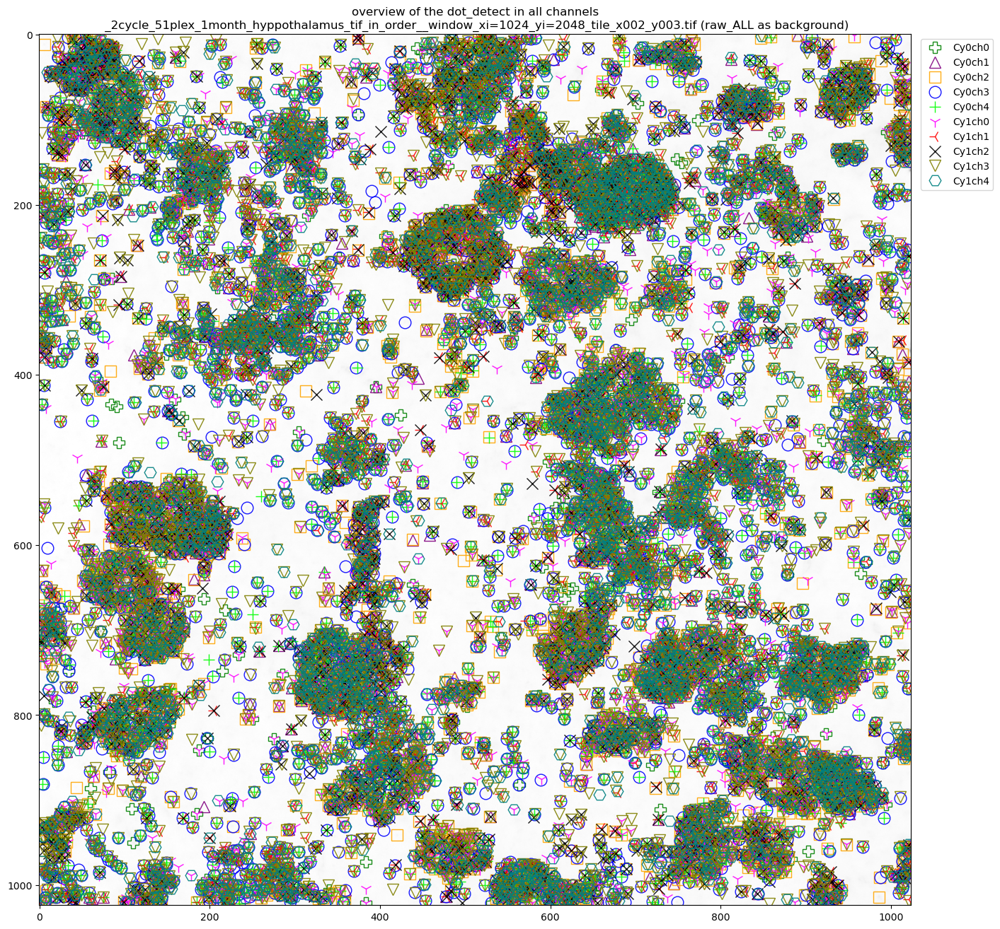

In [14]:
def overview_dot_detect_alignment(sample_in_order, file_in_order,
                                  sample_saving_path, 
                                  mmm_ch_list,
                                  dot_table_list, 
                                  marker_dict,
                                  background_ch_name = None):
    ###########################
    section_name = '_overview_dot_detect_alignment_{:}_{:}'.format(sample_in_order, 
                                                                   file_in_order.replace('.', '_'))
    ###########################
    ### background_mmm +++
    if background_ch_name is None:
        background_ch_name = 'raw_ALL'
    mmm_raw_zoom_origin = mmm_raw_as_background(sample_in_order, file_in_order, 
                                                sample_saving_path,
                                                mmm_ch_list,
                                                ch_name = background_ch_name)
    ### background_mmm ---
    ######################
    ############
    ### plotting
    figure_name = '{:}_figure'.format(section_name)
    file_suffix = '.png'
    save_figure = os.path.join(sample_saving_path, figure_name + file_suffix)
    AlvaFontSize = 12
    ###
    raw_pixel_y, raw_pixel_x = mmm_raw_zoom_origin.shape
    plt.figure(figsize = (16, 16*raw_pixel_y/raw_pixel_x))
    plt.title('overview of the dot_detect in all channels' +
              '\n {:}_{:} ({:} as background)'.format(sample_in_order, 
                                                      file_in_order,
                                                      background_ch_name),
              fontsize = AlvaFontSize) 
    ###
    for ch_name in list(marker_dict.keys()):
        for table_name in dot_table_list:
            if '{:}_table'.format(ch_name) in table_name:
                file_reading = os.path.join(sample_saving_path, table_name)
                dot_ttt = pd.read_csv(file_reading)
                ###
                dot_yy = dot_ttt['{:}_dot_yy'.format(ch_name)] 
                dot_xx = dot_ttt['{:}_dot_xx'.format(ch_name)] 
                ###
                plt.plot(dot_xx, dot_yy,
                         marker = marker_dict[ch_name], 
                         markersize = marker_size,
                         markeredgecolor = marker_edgecolor_dict[ch_name],
                         markerfacecolor = 'None', 
                         markeredgewidth = marker_edgewidth,
                         alpha = 0.9, linewidth = 0, label = '{:}'.format(ch_name))
    plt.imshow(mmm_raw_zoom_origin, cmap = 'Greys', 
               clim = list(np.percentile(mmm_raw_zoom_origin, [0.1, 99.9])))
    ###
    plt.legend(bbox_to_anchor = (1.1, 1))
    ###
    plt.savefig(save_figure, dpi = 256)
    plt.show()
    ##########
##########################
if __name__ == '__main__':
    overview_dot_detect_alignment(sample_in_order, file_in_order,
                                  sample_saving_path, 
                                  mmm_ch_list,
                                  dot_table_list, 
                                  marker_dict,
                                  background_ch_name = None)
    ###

## reading dot_detect table

In [15]:
def yy_xx_from_detect_dot_ttt(sample_in_order, sample_saving_path, dot_table_list,
                              ch_name):
    for table_name in dot_table_list:
        if '{:}_table'.format(ch_name) in table_name:
            file_reading = os.path.join(sample_saving_path, table_name)
            dot_ttt = pd.read_csv(file_reading)
            ###
            dot_yy = dot_ttt['{:}_dot_yy'.format(ch_name)] 
            dot_xx = dot_ttt['{:}_dot_xx'.format(ch_name)] 
            ###
    return np.array([dot_yy, dot_xx]).T
##########################
if __name__ == '__main__':
    ch_name = ch_name_list[0]
    print('ch_name =', ch_name)
    dot_A = yy_xx_from_detect_dot_ttt(sample_in_order, sample_saving_path, dot_table_list,
                                      ch_name = ch_name)
    print(dot_A.shape)

ch_name = Cy0ch0
(1034, 2)


## wording detect_dot

In [16]:
if __name__ == '__main__':
    for i in ch_name_list:
        ch_name = i
        print('ch_name =', ch_name)
        dot_A = yy_xx_from_detect_dot_ttt(sample_in_order, sample_saving_path, dot_table_list,
                                          ch_name = ch_name)
        print(dot_A.shape)

ch_name = Cy0ch0
(1034, 2)
ch_name = Cy0ch1
(1733, 2)
ch_name = Cy0ch2
(3164, 2)
ch_name = Cy0ch3
(3975, 2)
ch_name = Cy0ch4
(3933, 2)
ch_name = Cy1ch0
(3393, 2)
ch_name = Cy1ch1
(3093, 2)
ch_name = Cy1ch2
(2193, 2)
ch_name = Cy1ch3
(5258, 2)
ch_name = Cy1ch4
(3291, 2)


## single_cell_ccc

In [17]:
# dot_table_list
# ch_name_list
# mmm_ch_list

## computing ccc from NetMap

In [19]:
#%%time
##########################
if __name__ == '__main__':
    ###  
    ccc = cccNetMap_._ccc_from_net_map()
    ###############################
    print('ccc.shape =', ccc.shape)

ccc0.shape =  (1677, 34, 1200)
ccc.shape =  (74, 34, 1200)
ccc.shape = (74, 34, 1200)


## single_cell_view

cell_label = 63
mmm_raw_ch.min, max, mean = 30.0 255.0 40.29434394836426


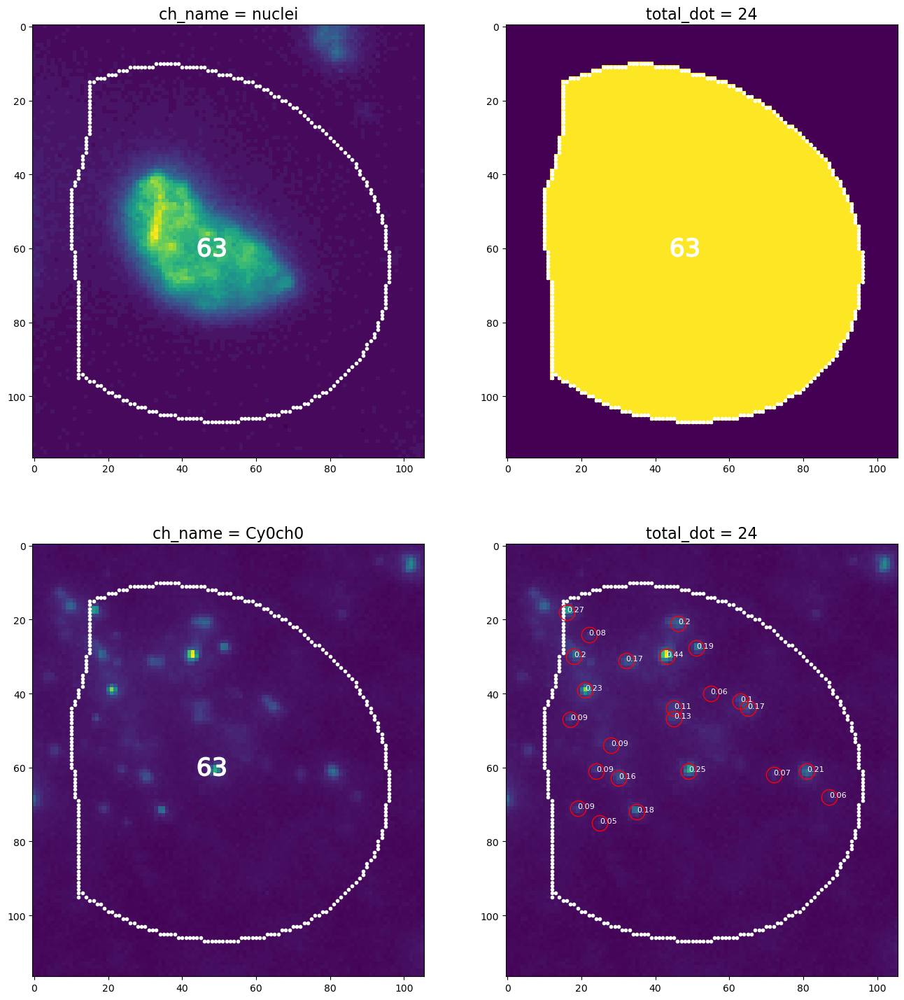

mmm_raw_ch.min, max, mean = 3.0 255.0 8.145492553710938


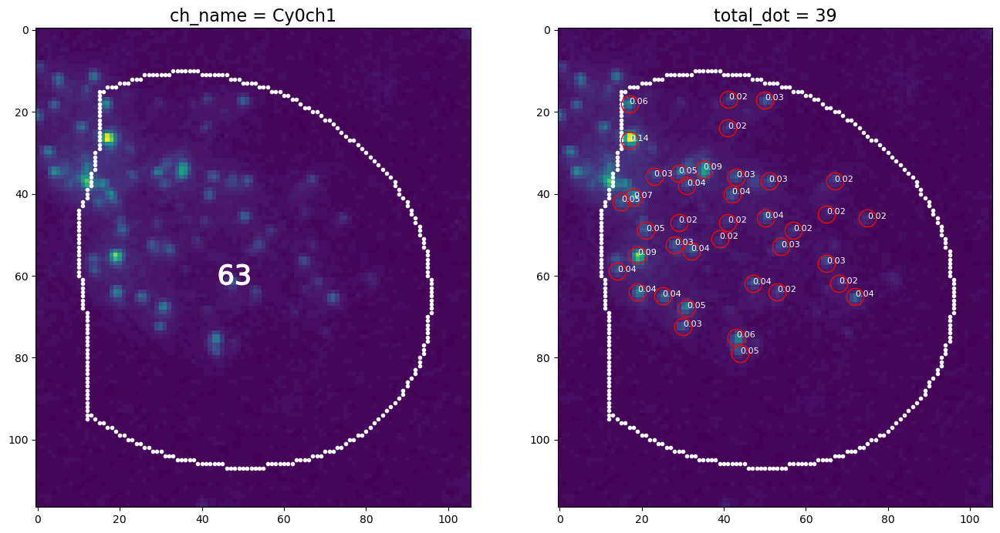

mmm_raw_ch.min, max, mean = 3.0 255.0 10.975177764892578


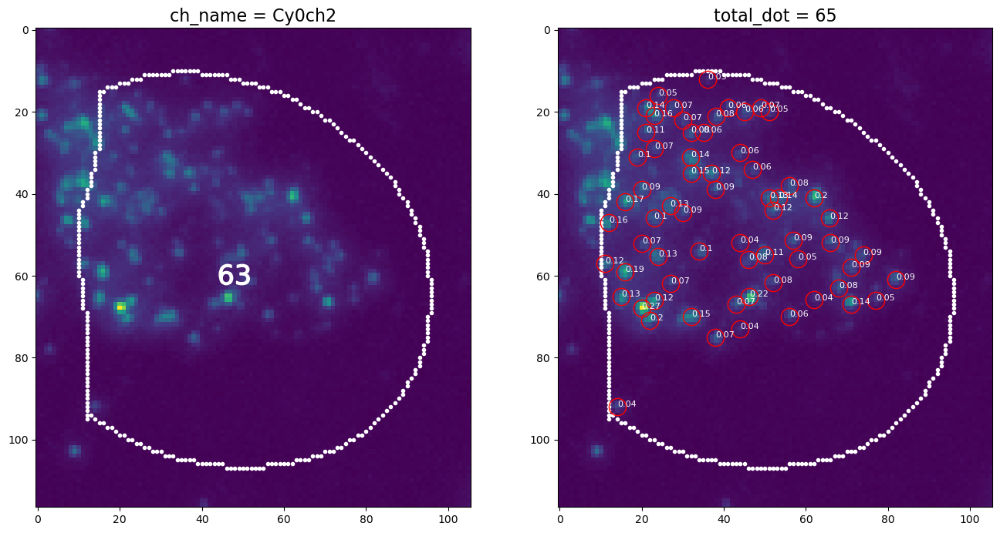

mmm_raw_ch.min, max, mean = 3.0 255.0 9.832127571105957


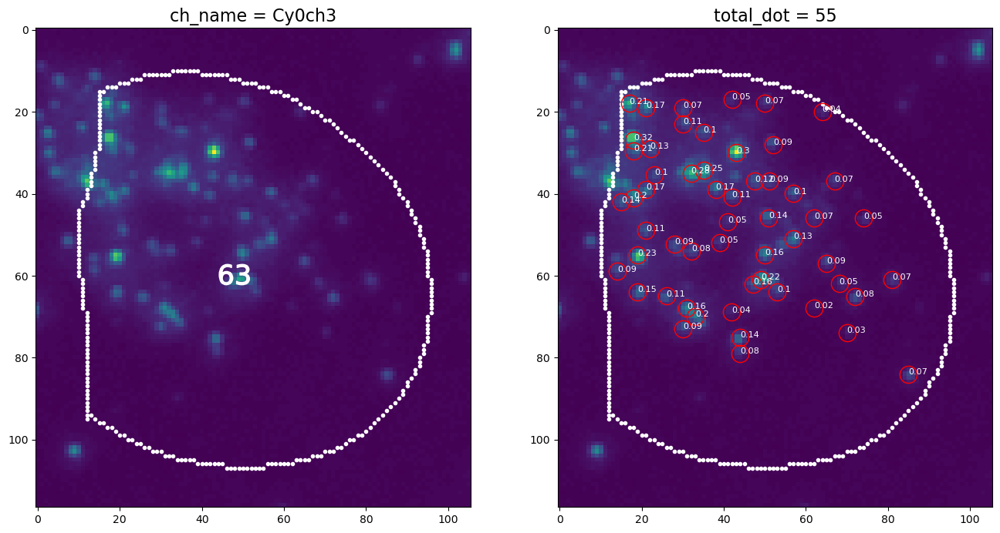

mmm_raw_ch.min, max, mean = 1.0 237.0 8.154690742492676


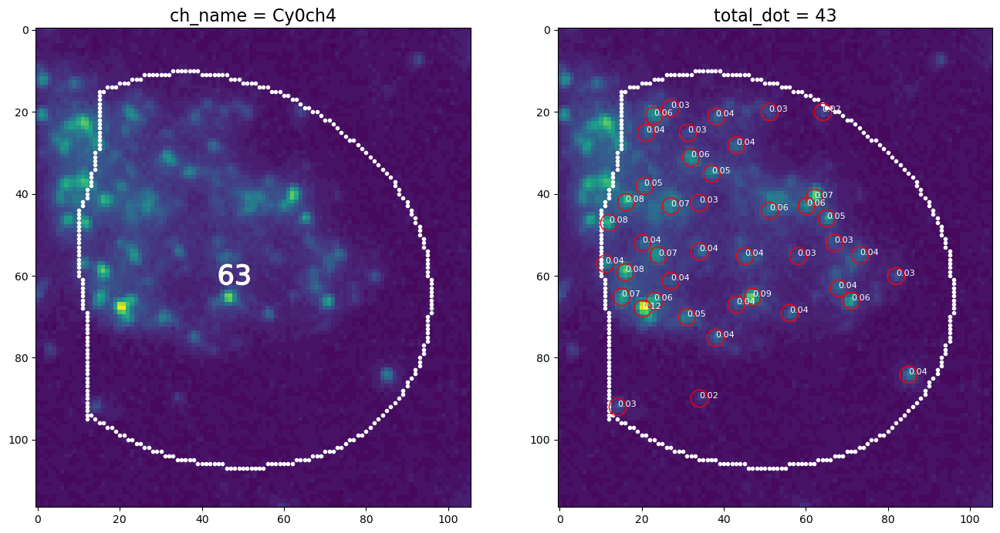

mmm_raw_ch.min, max, mean = 36.0 255.0 53.0670166015625


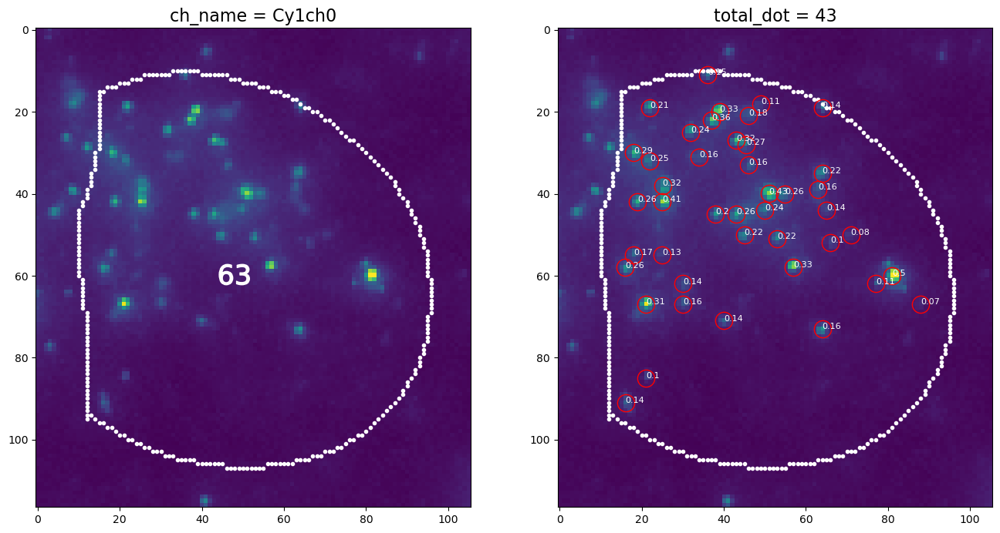

mmm_raw_ch.min, max, mean = 6.0 255.0 13.185164451599121


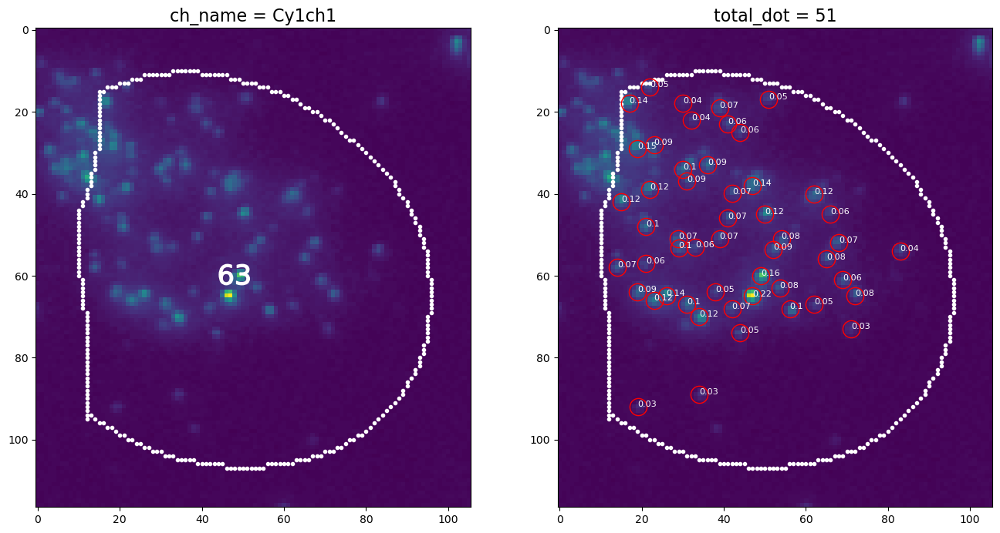

mmm_raw_ch.min, max, mean = 5.0 255.0 11.765233993530273


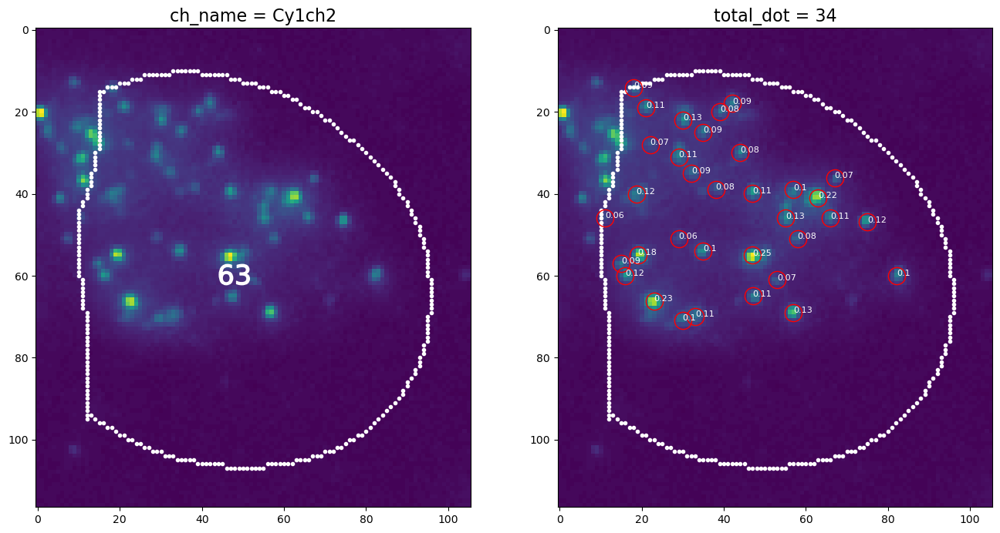

mmm_raw_ch.min, max, mean = 4.0 255.0 10.377256393432617


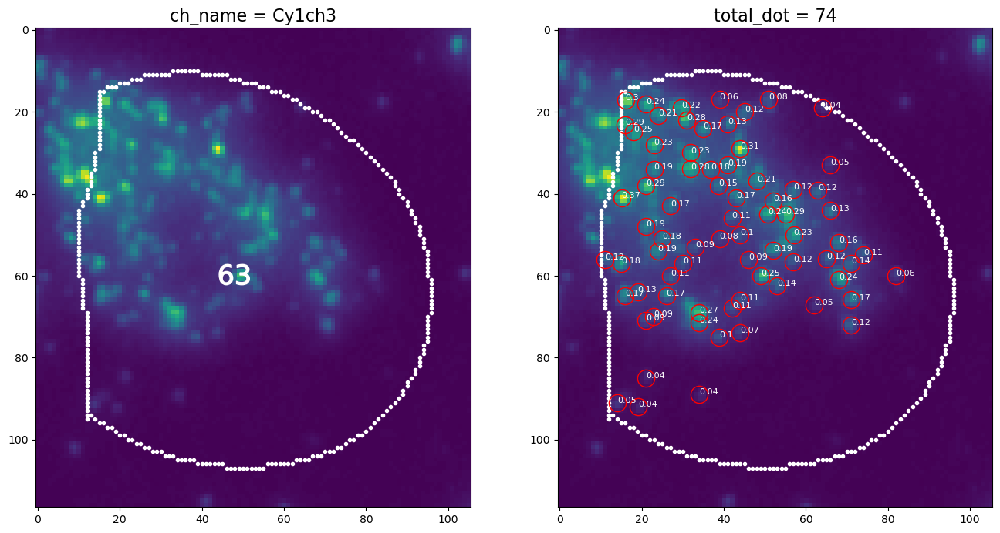

mmm_raw_ch.min, max, mean = 3.0 123.0 8.057330131530762


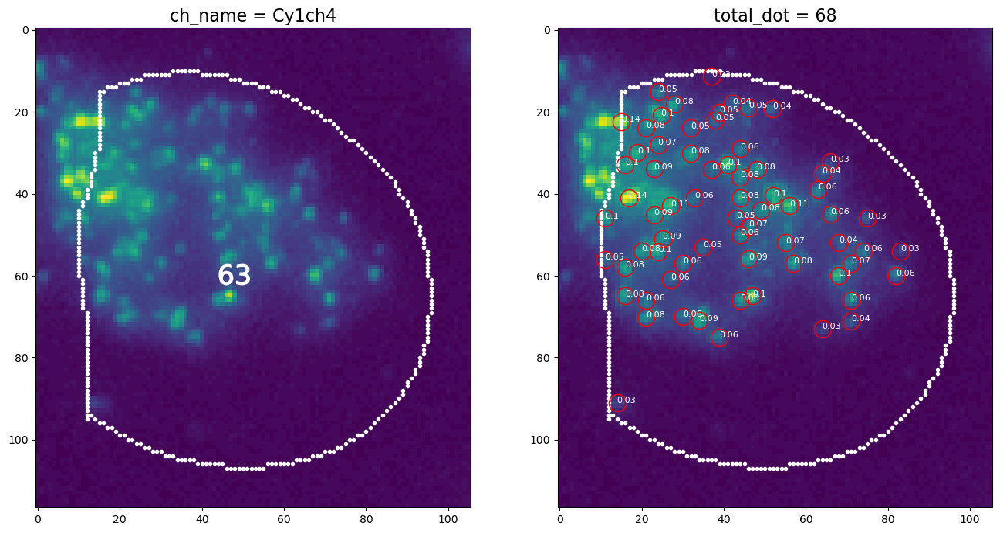

cell_i_demo = 63


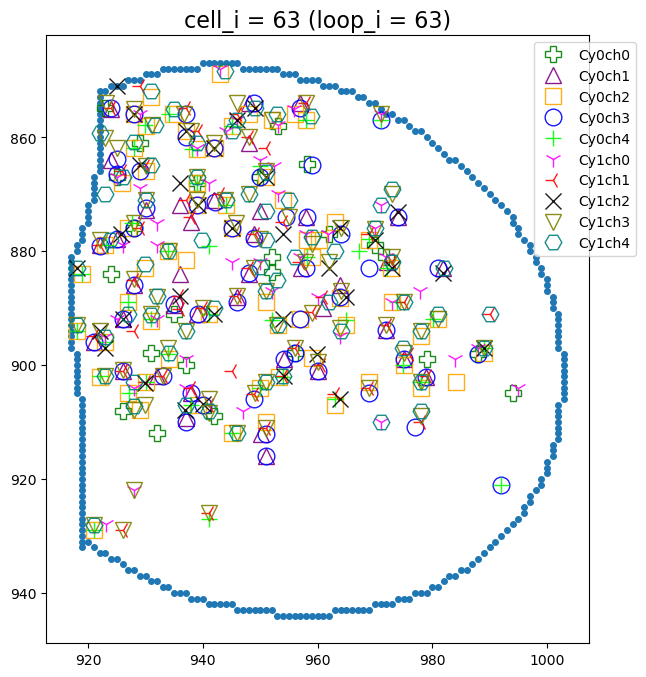

In [20]:
#########################
if __name__ == '__main__':
    ###
    cci, cell_i, loop_i = cccNetMap_._single_cell_view(ccc, cell_i = None,
                                                       loop_i = loop_i_demo,
                                                       plt_show = True)
    ###################
    ### cell_i_demo +++
    cell_i_demo = cell_i
    print('cell_i_demo =', cell_i_demo)
    ### cell_i_demo ---
    ###################
    #####################################
    ### reconstruction_of_single_cell +++
    section_name = '_reconstruction_of_cell={:}_loop={:}_tissue={:}_{:}'.format(cell_i, loop_i, 
                                                                                sample_in_order,
                                                                                file_in_order.replace('.', '_'))
    ###
    for i in range(ccc.shape[0]):
        yyxx_list = cccNetMap_._from_ccc_to_each_cell(ccc, i)
        iiyx = yyxx_list[cccNetMap_.id_column_index]
        ###
        if iiyx[cccNetMap_.cell_label_index] == cell_i:
            yy_index = len('yxm')*cccNetMap_.feature_channel_dict['membrane']
            loop_yy = yyxx_list[yy_index+0]
            loop_xx = yyxx_list[yy_index+1]
            ### plotting
            figure_name = '{:}_figure'.format(section_name)
            file_suffix = '.png'
            save_figure = os.path.join(sample_saving_path, figure_name + file_suffix)
            plt.figure(figsize = (7, 7*(loop_yy.max()-loop_yy.min())/(loop_xx.max()-loop_xx.min())))
            plt.plot(loop_xx, loop_yy, '.', markersize = 8)
            ###
            for ch_name in np.array(list(cccNetMap_.feature_channel_dict.keys())):
                if 'membrane' not in ch_name:
                    yy_index = len('yxm')*cccNetMap_.feature_channel_dict[ch_name]
                    dot_yy = yyxx_list[yy_index+0]
                    dot_xx = yyxx_list[yy_index+1]
                    plt.plot(dot_xx, dot_yy, marker = marker_dict[ch_name], 
                             markersize = 8+4, 
                             markeredgecolor = marker_edgecolor_dict[ch_name],
                             markerfacecolor = 'None', 
                             markeredgewidth = 1,
                             alpha = 0.9, linewidth = 0,
                             label = ch_name)
            ###
            plt.title('cell_i = {:} (loop_i = {:})'.format(cell_i, loop_i), fontsize = 16)
            plt.gca().invert_yaxis()
            ###
            plt.legend(bbox_to_anchor = (1.1, 1))
            plt.savefig(save_figure, dpi = 128)
            plt.show()
    ### reconstruction_of_single_cell ---
    #####################################

# aligning and decoding dots

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,908.13,977.99,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,909.00,977.99,0.0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,865.04,952.44,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
391,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,881.91,972.02,0.0
392,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,881.93,972.99,0.0
393,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,882.00,973.00,0.0


,bit_Cy0ch0,bit_Cy0ch1,bit_Cy0ch2,bit_Cy0ch3,bit_Cy0ch4,...,bit_Cy1ch2,bit_Cy1ch3,bit_Cy1ch4,dot_yy,dot_xx
0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,908.13,977.99
1,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,909.00,977.99
2,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,865.04,952.44
...,...,...,...,...,...,...,...,...,...,...,...
391,1.0,1.0,1.0,0.0,1.0,...,1.0,1.0,1.0,881.91,972.02
392,1.0,1.0,1.0,0.0,1.0,...,1.0,1.0,1.0,881.93,972.99
393,1.0,1.0,1.0,0.0,1.0,...,1.0,1.0,1.0,882.00,973.00


,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,856.00,971.0,0.0
1,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,855.00,935.0,0.0
2,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,857.75,930.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,904.00,937.0,0.0
46,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,856.00,948.0,0.0
47,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,897.00,956.0,0.0


,gene_type,copies_per_cell,10bit_word,0_bit_error_word,word_yy,word_xx,RNAseq_base
0,Cacna2d2,1,['0001110010'],['0001110010'],856.00,971.0,10bit_UltraPlex
1,Calb2,1,['0010100011'],['0010100011'],855.00,935.0,10bit_UltraPlex
2,Calb2,1,['0010100011'],['0010100011'],857.75,930.0,10bit_UltraPlex
3,Calb2,1,['0010100011'],['0010100011'],880.00,934.0,10bit_UltraPlex
4,Calb2,1,['0010100011'],['0010100011'],891.00,981.0,10bit_UltraPlex
...,...,...,...,...,...,...,...
43,blank_9,1,['0101010100'],['0101010100'],879.00,926.0,10bit_UltraPlex
44,blank_9,1,['0101010100'],['0101010100'],892.00,925.0,10bit_UltraPlex
45,blank_10,1,['0101011000'],['0101011000'],904.00,937.0,10bit_UltraPlex
46,Fmod,1,['0110000101'],['0110000101'],856.00,948.0,10bit_UltraPlex


,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,908.13,977.99,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,909.00,977.99,0.0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,865.04,952.44,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
391,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,881.91,972.02,0.0
392,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,881.93,972.99,0.0
393,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,882.00,973.00,0.0


,bit_Cy0ch0,bit_Cy0ch1,bit_Cy0ch2,bit_Cy0ch3,bit_Cy0ch4,...,bit_Cy1ch2,bit_Cy1ch3,bit_Cy1ch4,dot_yy,dot_xx
0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,908.13,977.99
1,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,909.00,977.99
2,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,865.04,952.44
...,...,...,...,...,...,...,...,...,...,...,...
391,1.0,1.0,1.0,0.0,1.0,...,1.0,1.0,1.0,881.91,972.02
392,1.0,1.0,1.0,0.0,1.0,...,1.0,1.0,1.0,881.93,972.99
393,1.0,1.0,1.0,0.0,1.0,...,1.0,1.0,1.0,882.00,973.00


,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,856.00,971.0,0.0
1,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,855.00,935.0,0.0
2,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,857.75,930.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
42,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,888.00,936.0,0.0
43,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,856.00,948.0,0.0
44,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,897.00,956.0,0.0


,gene_type,copies_per_cell,10bit_word,0_bit_error_word,word_yy,word_xx,RNAseq_base
0,Cacna2d2,1,['0001110010'],['0001110010'],856.00,971.0,10bit_UltraPlex
1,Calb2,1,['0010100011'],['0010100011'],855.00,935.0,10bit_UltraPlex
2,Calb2,1,['0010100011'],['0010100011'],857.75,930.0,10bit_UltraPlex
3,Calb2,1,['0010100011'],['0010100011'],880.00,934.0,10bit_UltraPlex
4,Calb2,1,['0010100011'],['0010100011'],891.00,981.0,10bit_UltraPlex
...,...,...,...,...,...,...,...
40,Sncg,1,['0101001010'],['0101001010'],902.00,932.0,10bit_UltraPlex
41,Sncg,1,['0101001010'],['0101001010'],912.00,950.0,10bit_UltraPlex
42,Aldh1a2,1,['0101001100'],['0101001100'],888.00,936.0,10bit_UltraPlex
43,Fmod,1,['0110000101'],['0110000101'],856.00,948.0,10bit_UltraPlex


color_1024__.shape = (204,)
Cy0ch0 as mmm_raw_zoom_origin.shape = (1024, 1024)


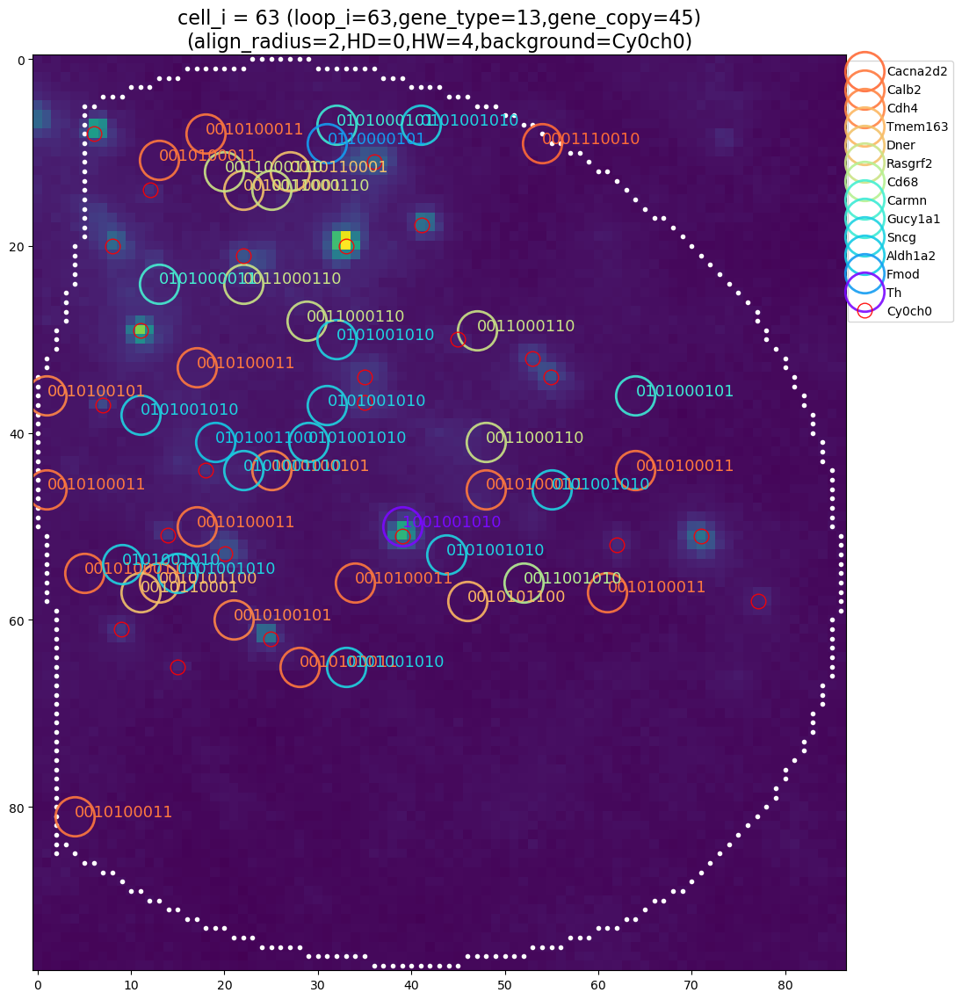

In [21]:
class word_ttt_from_aligned_dot_ccc(object):
    def __init__(cell, 
                 cccNetMap_,
                 ccc = None,
                 align_radius = None,
                 xbit_gene_dict = None,
                 total_wording_bit_Act = None,
                 plt_show = False, color_map = None, pd_print = False, near_mass_www = None):
        ###
        cell.cccNetMap_ = cccNetMap_
        cell.ccc = ccc
        cell.align_radius = align_radius
        cell.xbit_gene_dict = xbit_gene_dict
        cell.total_wording_bit_Act = total_wording_bit_Act
        if near_mass_www is None: near_mass_www = True
        cell.near_mass_www = near_mass_www
        #############
        ### color +++
        if color_map is None:
            color_map = 'viridis'
        if color_map == 'Greys':
            plot_color = 'red'
        else:
            plot_color = 'white'
        ###
        cell.plt_show = plt_show
        cell.color_map = color_map
        cell.plot_color = plot_color
        cell.pd_print = pd_print
        ### color ---
        #############
        ###---
        cell.sample_in_order = cell.cccNetMap_.sample_in_order
        cell.file_in_order = cell.cccNetMap_.file_in_order
        cell.sample_saving_path = cell.cccNetMap_.sample_saving_path
        cell.name_chii_dict = cell.cccNetMap_.name_chii_dict
        cell.mmm_label = cell.cccNetMap_.mmm_label
        cell.mmm_nuclei = cell.cccNetMap_.mmm_nuclei
        cell.mmm_ch_list = cell.cccNetMap_.mmm_ch_list
        ###
        cell.hamming_weight = np.int64(list(list(cell.xbit_gene_dict.keys())[0])).sum()
        ###---
    ####################
    def _scope_window_ii(cell, yyxx, target_yx = None, scope_window_size = None):
        ###
        if target_yx is None:
            target_yx = yyxx[0]
        if scope_window_size is None:
            scope_window_size = cell.align_radius*2
        ###
        iiy = (yyxx[:,0] > target_yx[0] - scope_window_size/2)
        iix = (yyxx[:,1] > target_yx[1] - scope_window_size/2)
        ii0 = np.logical_and(iiy, iix)
        ###
        iiy = (yyxx[:,0] < target_yx[0] + scope_window_size/2)
        iix = (yyxx[:,1] < target_yx[1] + scope_window_size/2)
        ii1 = np.logical_and(iiy, iix)
        ###
        ii__ = np.logical_and(ii0, ii1)
        ###
        return ii__
        ########### 
    ################################
    def _aligning_dot_of_cell_i(cell, 
                                cell_i, 
                                align_radius = None,
                                total_dot_max = None, 
                                pd_print = True, 
                                near_mass_www = None):
        ### setting +++
        ###
        cell_i_index = int(cell_i - 1) ## index starting from [0]
        ###
        if align_radius is None: align_radius = cell.align_radius
        if total_dot_max is None: 
            if cell.total_wording_bit_Act <= 16:
                total_dot_max = 1024
            elif cell.total_wording_bit_Act > 16:
                total_dot_max = 2048
        ###
        if near_mass_www is None: near_mass_www = cell.near_mass_www
        ### setting ---
        ###########################
        section_name = '_aligning_dot_of_cell_i={:}_tissue={:}_align_radius={:}'.format(cell_i, 
                                                                        cell.sample_in_order,
                                                                        cell.file_in_order.replace('.', '_'),
                                                                                        align_radius)
        ###########################
        ###
        aaa0 = np.zeros([total_dot_max, cell.total_wording_bit_Act + len('yxm'), cell.total_wording_bit_Act])
        ###
        ch_A = 0
        for ch_name_A in list(cell.name_chii_dict.keys()):
            ch_B = 0
            for ch_name_B in list(cell.name_chii_dict.keys()):
                ###
                #print('ch_name_A, ch_name_B =', ch_name_A, ch_name_B)
                ###########
                ### ABC +++
                yyxx_list = cell.cccNetMap_._from_ccc_to_each_cell(cell.ccc, cell_i_index)
                yy_index = len('yxm')*cell.cccNetMap_.feature_channel_dict[ch_name_A]
                ###
                dot_yy_A = yyxx_list[yy_index+0]
                dot_xx_A = yyxx_list[yy_index+1]
                ###
                dot_A = np.array([dot_yy_A, dot_xx_A]).T
                #print('dot_A.shape =', dot_A.shape)
                ###
                yyxx_list = cell.cccNetMap_._from_ccc_to_each_cell(cell.ccc, cell_i_index)
                yy_index = len('yxm')*cell.cccNetMap_.feature_channel_dict[ch_name_B]
                ###
                dot_yy_B = yyxx_list[yy_index+0]
                dot_xx_B = yyxx_list[yy_index+1]
                dot_mm_B = yyxx_list[yy_index+2]
                ###
                dot_B = np.array([dot_yy_B, dot_xx_B, dot_mm_B]).T
                ###
                i = 0
                for y_A, x_A in zip(dot_yy_A, dot_xx_A):
                    ii__ = cell._scope_window_ii(dot_B, target_yx = [y_A, x_A])
                    window_B = dot_B[ii__]
                    for y_B, x_B, m_B in zip(window_B[:, 0], window_B[:, 1], window_B[:, 2]):
                    #for y_B, x_B in zip(dot_yy_B, dot_xx_B):
                        dy = -(y_A - y_B) ## negative due to the fact of y_axis is upside down in plt.imshow(image)
                        dx = x_A - x_B
                        dr = np.power(dy**2 + dx**2, 0.5)
                        if dr <= cell.align_radius:
                            if near_mass_www:
                                aaa0[i, ch_B, ch_A] = 1*m_B
                            else:
                                aaa0[i, ch_B, ch_A] = True
                    ###
                    aaa0[i, cell.total_wording_bit_Act+0, ch_A] = round(y_A, 2)
                    aaa0[i, cell.total_wording_bit_Act+1, ch_A] = round(x_A, 2)
                    ###
                    i = i + 1
                    ###
                ch_B = ch_B + 1
                ### ABC ---
                ########### 
            ch_A = ch_A + 1
            ###
        ###
        #print('aaa0.shape =', aaa0.shape)
        aaa0 = aaa0.transpose(2, 0, 1)
        #print('aaa0.shape =', aaa0.shape)
        aaa0 = aaa0.reshape(aaa0.shape[0]*aaa0.shape[1], aaa0.shape[2])
        ###################
        ### actual_size +++
        #print('aaa0.shape = ' , aaa0.shape)
        aaa__float = aaa0[aaa0.sum(axis = (1)) > 0]
        #print('aaa__float.shape = ' , aaa__float.shape)
        aaa__ = np.unique(np.round(aaa__float, 2), axis = 0)
        aaa_HW = []
        for i in range(aaa__.shape[0]):
            wi = aaa__[i]
            ###############################
            ### checking hamming_weight +++
            total_non_zero_bit = len(np.nonzero(wi[0:cell.total_wording_bit_Act])[0])
            #if (total_non_zero_bit >= cell.hamming_weight-1) and (total_non_zero_bit <= cell.hamming_weight+1):
            if (total_non_zero_bit >= cell.hamming_weight-1):
            #if (total_non_zero_bit == cell.hamming_weight):
                aaa_HW.append(wi)
            ### checking hamming_weight ---
            ###############################
        ### in_case_of_empty +++
        if len(aaa_HW) == 0:
            aaa_HW = aaa__[0:1]
        ### in_case_of_empty ---
        aaa = np.array(aaa_HW)
        #print('aaa.shape =', aaa.shape)
        ### actual_size ---
        ################### 
        if near_mass_www:
            ####################
            ### nearest_word +++
            bit_aaa = np.copy(aaa)
            for i in range(aaa.shape[0]):
                word_i = aaa[i, 0:cell.total_wording_bit_Act]
                nearest_word, ttt_min = cell._nearest_word_in_vector_space(word_i, 
                                                                           xbit_gene_dict = None,
                                                                           pd_print = False)
                ############
                ### demo +++
                if (i in [0, int(aaa.shape[0]/2)]) and (pd_print == True):
                    alva_tool.pd_print(ttt_min)
                ### demo ---
                ############
                bit_aaa[i, 0:cell.total_wording_bit_Act] = np.int8(list(nearest_word))
            ### nearest_word ---
            ####################
            if pd_print:
                #################
                ### dot_table +++
                mass_ttt = pd.DataFrame()
                ###
                for i in range(len(cell.name_chii_dict.keys())):
                    mass_ttt['mass_{:}'.format(list(cell.name_chii_dict.keys())[i])] = aaa[:, i]
                ###
                mass_ttt['dot_yy'] = aaa[:, cell.total_wording_bit_Act+0]
                mass_ttt['dot_xx'] = aaa[:, cell.total_wording_bit_Act+1]
                ### dot_table ---
                #################
                alva_tool.pd_print(mass_ttt, column = aaa.shape[0], row = 6)
        else:
            bit_aaa = aaa
        ###
        if pd_print:
            alva_tool.pd_print(bit_aaa, column = aaa.shape[0], row = 6)
        ###
        #################
        ### dot_table +++
        bit_ttt = pd.DataFrame()
        ###
        for i in range(len(cell.name_chii_dict.keys())):
            bit_ttt['bit_{:}'.format(list(cell.name_chii_dict.keys())[i])] = bit_aaa[:, i]
        ###
        bit_ttt['dot_yy'] = bit_aaa[:, cell.total_wording_bit_Act+0]
        bit_ttt['dot_xx'] = bit_aaa[:, cell.total_wording_bit_Act+1]
        ####################
        ### saving_table +++
#         table_name = '_{:}_table'.format(section_name)
#         file_suffix = '.csv'
#         save_path = os.path.join(cell.sample_saving_path, table_name + file_suffix)
#         bit_ttt.to_csv(save_path, index = False)
#         ###
#         ttt = pd.read_csv(save_path)
#         bit_ttt__ = ttt
        ### saving_table ---
        ####################
        if pd_print:
            alva_tool.pd_print(bit_ttt, row = 6)
        ### dot_table ---
        #################
        return bit_aaa
        ##########
    ##############
    def _hamming_AB(cell, word_A, word_B):
        ### word_A, word_B must be the same lenght and format (int or str)
        dr = 0
        for i in range(len(word_A)):
            if word_A[i] != word_B[i]:
                dr = dr + 1
                ###
        return dr
        #########
    # print(hamming_AB('0011', '0111'))
    # print(hamming_AB([0,0,1,1], [0,1,1,1]))
    ###
    #####################
    def _matched_HD_word_from_aligned_dot_aaa(cell, 
                                              aaa,
                                              xbit_gene_dict = None,
                                              tissue_name_RNAseq = tissue_name_RNAseq, 
                                              hamming_distance = None, 
                                              pd_print = True,
                                              near_mass_www = None):
        ### setting ---
        if hamming_distance is None: hamming_distance = 0
        #print('hamming_distance =', hamming_distance)
        if xbit_gene_dict is None: xbit_gene_dict = cell.xbit_gene_dict
        ###
        if near_mass_www is None: near_mass_www = cell.near_mass_www
        ### setting ---
        ###########################
        section_name = '_matched_HD_word_from_aligned_dot_aaa_tissue={:}_{:}'.format(cell.sample_in_order, 
                                                                        cell.file_in_order.replace('.', '_'))
        ###########################
        ##############
        ### unique +++
        aa2 = np.int8(aaa[:, 0:cell.total_wording_bit_Act]).astype(str)
        #print('aa2.shape', aa2.shape)
        uu2 = np.unique(aa2, axis = 0)
        #print('uu2.shape', uu2.shape)
        #alva_tool.pd_print(uu2, row = 600)
        if (near_mass_www == True) and (hamming_distance == 0):
            hh2 = uu2
        else:
            hh2 = []
            for i in range(uu2.shape[0]):
                for k in range(len(xbit_gene_dict)):
                    xbit_i = uu2[i]
                    word_i = ''.join(xbit_i)
                    ###
                    word_k = list(xbit_gene_dict.keys())[k]
                    dr = cell._hamming_AB(word_i, word_k)
                    if dr == hamming_distance:
                        hh2.append(uu2[i])
            hh2 = np.array(hh2)
        #print('hh2.shape', hh2.shape)
        #alva_tool.pd_print(hh2, row = 600)
        ###################
        if len(hh2.shape) >= 2:
            chosen_aaa__ = np.zeros([cell.total_wording_bit_Act+len('yxm')])
            for i in range(hh2.shape[0]):
                dense_aaa__i = aaa[np.where((aa2 == hh2[i]).all(axis = 1))[0]]
                ###
                ############################
                ### clustering_dense_dot +++
                #print('dense_aai ------------')
                #alva_tool.pd_print(dense_aaa__i)
                dot_yy = dense_aaa__i[:, cell.total_wording_bit_Act+0]
                dot_xx = dense_aaa__i[:, cell.total_wording_bit_Act+1]
                chosen_yy, chosen_xx = alva_tool.chosen_dot_by_mmm(dot_yy, dot_xx,
                                                                   sub_pixel_resolution = 0.25,
                                                                   align_radius = cell.align_radius)
                chosen_aaa__i = dense_aaa__i[0:len(chosen_xx)]
                chosen_aaa__i[:, cell.total_wording_bit_Act+0] = chosen_yy
                chosen_aaa__i[:, cell.total_wording_bit_Act+1] = chosen_xx
                #print('chosen_yy, chosen_xx', chosen_yy, chosen_xx)
                #print('chosen_aaa__i ------------')
                #alva_tool.pd_print(chosen_aaa__i, row = 60)
                ### clustering_dense_dot ---
                ############################
                chosen_aaa__ = np.vstack((chosen_aaa__, chosen_aaa__i))
                #print('chosen_aaa__ ------------')
                #alva_tool.pd_print(chosen_aaa__, row = 60)
            #print('chosen_aaa__.shape =', chosen_aaa__.shape)
            chosen_aaa = chosen_aaa__[1:] ## keeping non_zero
            #print('chosen_aaa.shape =', chosen_aaa.shape)
            if pd_print:
                alva_tool.pd_print(chosen_aaa, column = chosen_aaa.shape[0], row = 6)
            ### unique ---
        else:
            chosen_aaa = np.array([])
        ##############
        ### building ttt with specific 'xbit_word' and '_error_bit_word'
        if len(chosen_aaa.shape) == 2:
            ############
            ### data +++
            chosen_aaa__2 = np.int8(chosen_aaa[:, 0:cell.total_wording_bit_Act]).astype(str)
            ###
            word_kkk__ = []
            name_kkk__ = []
            word_iii__ = []
            yy__ = []
            xx__ = []
            for i in range(chosen_aaa__2.shape[0]):
                for k in range(len(xbit_gene_dict)):
                    xbit_i = chosen_aaa__2[i]
                    word_i = ''.join(xbit_i)
                    ###
                    word_k = list(xbit_gene_dict.keys())[k]
                    dr = cell._hamming_AB(word_i, word_k)
                    if dr == hamming_distance:
                        word_kkk__.append([word_k])
                        name_k = xbit_gene_dict[word_k]
                        name_kkk__.append(name_k)
                        ###
                        word_iii__.append([word_i])
                        yy__.append(chosen_aaa[i, cell.total_wording_bit_Act+0])
                        xx__.append(chosen_aaa[i, cell.total_wording_bit_Act+1])
            ### data ---
            ############
        else:
            ## uuu is empty
            return pd.DataFrame()
        #################
        ### dot_table +++
        ttt__ = pd.DataFrame()
        ###
        ttt__['gene_type'] = name_kkk__
        ## recording each_matched_gene_copy as one
        ttt__['copies_per_cell'] = 1 
        ttt__['{:}bit_word'.format(cell.total_wording_bit_Act)] = word_kkk__
        ttt__['{:}_bit_error_word'.format(hamming_distance)] = word_iii__
        ttt__['word_yy'] = yy__
        ttt__['word_xx'] = xx__
        ttt__['RNAseq_base'] = '{:}bit_UltraPlex'.format(cell.total_wording_bit_Act)
        ####################
        ### saving_table +++
        table_name = '_{:}_table'.format(section_name)
        file_suffix = '.csv'
        save_path = os.path.join(cell.sample_saving_path, table_name + file_suffix)
        ttt__.to_csv(save_path, index = False)
        ###
        word_ttt = pd.read_csv(save_path)
        if pd_print:
            alva_tool.pd_print(word_ttt, row = 16)
        ### saving_table ---
        ####################
        return word_ttt
        ###############
    ##################################
    def _word_ttt_from_aligned_dot_ccc(cell,
                                       ccc = None, 
                                       align_radius = None,
                                       xbit_gene_dict = None,
                                       hamming_distance = None):
        ### setting +++
        if ccc is None: ccc = cell.ccc
        if align_radius is None: align_radius = cell.align_radius
        if xbit_gene_dict is None: xbit_gene_dict = cell.xbit_gene_dict
        if hamming_distance is None: hamming_distance = 0
        print('hamming_distance =', hamming_distance)
        print('near_mass_www =', cell.near_mass_www)
        ### setting ---
        ###########################
        section_name = '_word_ttt_from_aligned_dot_ccc_tissue={:}_{:}_align={:}_Hw={:}'.format(
                                                                        cell.sample_in_order,
                                                                        cell.file_in_order.replace('.', '_'),
                                                                                            align_radius, 
                                                                                            cell.hamming_weight)
        ###########################
        ###
        cell_ttt_list = []
        word_ttt_list = []
        for i in iWatcher(range(ccc.shape[0])):
            ###
            cell_i = i + 1
            ###
            aaa_i = cell._aligning_dot_of_cell_i(cell_i, 
                                                 align_radius = align_radius,
                                                 total_dot_max = None, 
                                                 pd_print = False)
            ###
            word_ttt_i = cell._matched_HD_word_from_aligned_dot_aaa(aaa_i,
                                                                    xbit_gene_dict = xbit_gene_dict,
                                                                    tissue_name_RNAseq = tissue_name_RNAseq,
                                                                    hamming_distance = hamming_distance,
                                                                    pd_print = False)
            ###---
            if len(word_ttt_i) > 0:
                word_ttt_i['cell_id'] = cell_i
            else:
                cell_ttt_i = pd.DataFrame()
            ###---
            ###---
            if len(word_ttt_i) > 0:
                cell_ttt_i = pd.DataFrame()
                cell_ttt_i['gene_type'] = np.unique(word_ttt_i['gene_type'].values)
                cell_ttt_i['total_gene_cell'] = 1
            else:
                cell_ttt_i = pd.DataFrame()
            ###---
            cell_ttt_list.append(cell_ttt_i)
            word_ttt_list.append(word_ttt_i)
        ###
        cell_ttt = pd.concat(cell_ttt_list, ignore_index = True)
        type_cell_ttt = cell_ttt.groupby(by = ['gene_type'], as_index = False).sum() 
        alva_tool.pd_print(type_cell_ttt, row = 8)
        ###
        word_ttt__ = pd.concat(word_ttt_list, ignore_index = True)
        ####################
        ### saving_table +++
        table_name = '_{:}_table'.format(section_name)
        file_suffix = '.csv'
        save_path = os.path.join(cell.sample_saving_path, table_name + file_suffix)
        word_ttt__.to_csv(save_path, index = False)
        ###
        word_ttt = pd.read_csv(save_path)
        alva_tool.pd_print(word_ttt)
        ### saving_table ---
        ####################
        ###########################
        ### computing_mean_copy +++
        type_copy_ttt = word_ttt.iloc[:, 0:2].groupby(by = ['gene_type'], as_index = False).sum() 
        alva_tool.pd_print(type_copy_ttt, row = 8)
        type_copy_ttt = pd.merge(type_copy_ttt, type_cell_ttt)
        alva_tool.pd_print(type_copy_ttt, row = 8)
        type_copy_ttt = type_copy_ttt.rename(columns = {type_copy_ttt.columns[1]: 'total_gene_copy'})
        copy_per_cell = type_copy_ttt['total_gene_copy'].values / type_copy_ttt['total_gene_cell'].values
        type_copy_ttt['copies_per_cell'] = np.round(copy_per_cell, 3)
        ### reordering_column_name
        type_copy_ttt__order = type_copy_ttt[['gene_type', 
                                              'copies_per_cell',
                                              'total_gene_copy', 
                                              'total_gene_cell']].copy()
        ###
        total_nonzero_cell = type_copy_ttt['total_gene_cell'].values.max()
        type_copy_ttt__order['total_cell_of_non_zero'] = total_nonzero_cell
        gene_copy_per_nonzero = np.round(type_copy_ttt['total_gene_copy'].values / total_nonzero_cell, 2)
        type_copy_ttt__order['copies_per_average'] = gene_copy_per_nonzero
        type_copy_ttt__order['x_bit_error'] = '{:}_bit_error'.format(hamming_distance)
        type_copy_ttt__order['RNAseq_base'] = '{:}bit_UltraPlex'.format(cell.total_wording_bit_Act)
        #alva_tool.pd_print(type_copy_ttt__order, row = 8)
        ### computing_mean_copy ---
        ###########################
        ####################
        ### saving_table +++
        table_name = '_type_{:}_table'.format(section_name)
        file_suffix = '.csv'
        save_path = os.path.join(cell.sample_saving_path, table_name + file_suffix)
        type_copy_ttt__order.to_csv(save_path, index = False)
        ###
        type_copy_ttt__order__ = pd.read_csv(save_path)
        alva_tool.pd_print(type_copy_ttt__order__)
        ### saving_table ---
        ####################
        return word_ttt, type_copy_ttt__order
        #########################################
    ####################################
    def _mapping_gene_word_of_total_cell(cell, 
                                         word_ttt,
                                         xbit_gene_dict = None,
                                         back_ch_name_list = None, 
                                         **kwargs):
        ### setting ---
        if xbit_gene_dict is None: xbit_gene_dict = cell.xbit_gene_dict
        #print('xbit_gene_dict =', xbit_gene_dict)
        if back_ch_name_list is None: back_ch_name_list = list(cell.name_chii_dict.keys())[0]
        ### setting ---
        ##############
        ### kwargs +++ 
        membrane_marker_size = kwargs['membrane_marker_size']
        dot_marker_size = kwargs['dot_marker_size']
        gene_marker_size = kwargs['gene_marker_size']
        gene_marker_type = kwargs['gene_marker_type']
        ### kwargs ---
        ##############
        ##################################
        ### reconstruction_of_all_cell +++
        section_name = '_mapping_gene_word_of_total_cell={:}_tissue={:}_{:}'.format(cell.ccc.shape[0],
                                                                                    cell.sample_in_order,
                                                                    cell.file_in_order.replace('.', '_'))
        ### reconstruction_of_all_cell ---
        ##################################
        ######################
        ##################
        ### color_1024 +++
        color_1024__ = alva_tool.color_1024_list(total_color = 4*len(xbit_gene_dict))[::-2]
        #color_1024__ = color_list__(total_color = len(gene_xbit_dict))
        ### color_1024 ---
        ##################
        ############
        ### plotting
        figure_name = '{:}_figure'.format(section_name)
        file_suffix = '.png'
        save_figure = os.path.join(cell.sample_saving_path, figure_name + file_suffix)
        ###
        AlvaFontSize = 16
        wX = 1
        wY = round(len(back_ch_name_list)/wX)
        wxx = 16 # window_width
        raw_pixel_y, raw_pixel_x = cell.mmm_nuclei.shape
        figure = plt.figure(figsize = (wX*wxx, wY*wxx*(raw_pixel_y / raw_pixel_x)))
        for wn in range(wX*wY):
            window = figure.add_subplot(wY, wX, wn + 1)
            ###
            for i in range(cell.ccc.shape[0]):
                yyxx_list = cell.cccNetMap_._from_ccc_to_each_cell(cell.ccc, i)
                iiyx = yyxx_list[cell.cccNetMap_.id_column_index]
                ###
                yy_index = len('yxm')*cell.cccNetMap_.feature_channel_dict['membrane']
                yy = yyxx_list[yy_index+0] 
                xx = yyxx_list[yy_index+1] 
                ###
                window.plot(xx, yy, '.', markersize = membrane_marker_size)
                ###
                ###############
                ### ch_name +++
                ch_name = back_ch_name_list[wn]
                yy_index = len('yxm')*cell.cccNetMap_.feature_channel_dict[ch_name]
                dot_yy__ = yyxx_list[yy_index+0] 
                dot_xx__ = yyxx_list[yy_index+1] 
                window.plot(dot_xx__, dot_yy__, marker = 'o', #marker_dict[ch_name], 
                         markersize = dot_marker_size, 
                         markeredgecolor = 'red', #marker_edgecolor_dict[ch_name],
                         markerfacecolor = 'None', 
                         markeredgewidth = 1,
                         alpha = 0.9, linewidth = 0)
                ### ch_name ---
                ###############                        
            #################
            ### gene_word +++
            for i in range(len(xbit_gene_dict)):
                word_i = list(xbit_gene_dict.keys())[i]
                gene_i = xbit_gene_dict[word_i]
                gene_ttt = word_ttt[word_ttt['gene_type'].values == gene_i]
                if len(gene_ttt) >= 1:
                    word_yy = gene_ttt['word_yy'].values 
                    word_xx = gene_ttt['word_xx'].values 
                    window.plot(word_xx, word_yy, 
                                marker = gene_marker_type, 
                                markersize = gene_marker_size, 
                                markeredgecolor = color_1024__[i],
                                markerfacecolor = 'None', 
                                markeredgewidth = gene_marker_size/16,
                                alpha = 0.9, linewidth = 0,
                                label = '{:}'.format(gene_i))
                    ###
                    for w in range(len(word_xx)):
                        y = word_yy[w]
                        x = word_xx[w]
                        text_color = color_1024__[i]
                        window.text(x, y, word_i, fontsize = 8+4, color = text_color)     
            ### gene_word ---
            #################
            ######################
            ### background_mmm +++
            mmm_raw_zoom_origin = mmm_raw_as_background(sample_in_order = cell.sample_in_order, 
                                                        file_in_order = cell.file_in_order,
                                                        sample_saving_path = cell.sample_saving_path,
                                                        mmm_ch_list = cell.mmm_ch_list, 
                                                        ch_name = back_ch_name_list[wn])
            ### background_mmm ---
            ######################
            cell_mmm = mmm_raw_zoom_origin
            window.imshow(cell_mmm, cmap = cell.cccNetMap_.color_map)
            ###
            window.set_title('total_cell = {:} (gene_type={:}, gene_copy={:})'.format(cell.ccc.shape[0],
                                                len(np.unique(word_ttt['gene_type'].values)), 
                                                len(word_ttt['gene_type'].values)) +
                             '\n(align_radius={:}, background={:})'.format(align_radius,
                                                                           back_ch_name_list[wn]) +
                             '\n(sample_in_order={:})'.format(cell.sample_in_order),
                             fontsize = AlvaFontSize)
            window.legend(bbox_to_anchor = (1.12, 1))
            ###
        ###
        plt.savefig(save_figure, dpi = 256)
        plt.show()
        ##########
    ################################
    def _mapping_gene_word_of_cell_i(cell, 
                                     cell_i, 
                                     align_radius = None,
                                     xbit_gene_dict = None,
                                     hamming_distance = None,
                                     back_ch_name_list = None):
        ### setting ---
        if align_radius is None: align_radius = cell.align_radius
        if xbit_gene_dict is None: xbit_gene_dict = cell.xbit_gene_dict
        if hamming_distance is None: hamming_distance = 0
        #print('hamming_distance =', hamming_distance)
        if back_ch_name_list is None: back_ch_name_list = list(cell.name_chii_dict.keys())[0]
        ### setting ---
        ##################################
        ### cell_label ---> loop_label +++
        cci = cell.ccc[cell.ccc[:, cell.cccNetMap_.id_column_index, cell.cccNetMap_.cell_label_index] == cell_i]
        loop_i = int(cci[0, cell.cccNetMap_.id_column_index, cell.cccNetMap_.loop_label_index])
        #print('loop_label =', loop_i) 
        ### cell_label ---> loop_label ---
        ##################################
        ###########################
        section_name = '_mapping_gene_word_of_cell_i={:}_loop_i={:}_tissue={:}_{:}_align={:}_HD={:}_HW={:}'.format(
                                                                        cell_i, loop_i,
                                                                        cell.sample_in_order,
                                                                        cell.file_in_order.replace('.', '_'),
                                                                                    align_radius,
                                                                                    hamming_distance, 
                                                                                    cell.hamming_weight)
        ###########################
        ############################
        ### word_ttt_single_cell +++
        aaa_i = cell._aligning_dot_of_cell_i(cell_i, 
                                             align_radius = align_radius)
        ###
        ###
        word_ttt_i = cell._matched_HD_word_from_aligned_dot_aaa(aaa_i,
                                                                xbit_gene_dict = xbit_gene_dict,
                                                                tissue_name_RNAseq = tissue_name_RNAseq,
                                                                hamming_distance = hamming_distance)
        ### word_ttt_single_cell ---
        ############################
        word_ttt = word_ttt_i
        if len(word_ttt) >= 1:
            #####################################
            ### reconstruction_of_single_cell +++
            ###
            cell_i_index = int(cell_i - 1) ## index starting from [0]
            ###
            yyxx_list = cell.cccNetMap_._from_ccc_to_each_cell(cell.ccc, cell_i_index)
            iiyx = yyxx_list[cell.cccNetMap_.id_column_index]
            ###
            yy_index = len('yxm')*cell.cccNetMap_.feature_channel_dict['membrane']
            yy__ = yyxx_list[yy_index+0] 
            xx__ = yyxx_list[yy_index+1] 
            yy_min = round(yy__.min() - 0)
            xx_min = round(xx__.min() - 0)
            yy_max = round(yy__.max() + 1)
            xx_max = round(xx__.max() + 1)
            loop_yy = yy__ - yy_min
            loop_xx = xx__ - xx_min     
            ##################
            ##################
            ### color_1024 +++
            color_1024__ = alva_tool.color_1024_list(total_color = 4*len(xbit_gene_dict))[::-4]
            #color_1024__ = color_list__(total_color = len(gene_xbit_dict))
            ### color_1024 ---
            ##################
            ############
            ### plotting
            figure_name = '{:}_figure'.format(section_name)
            file_suffix = '.png'
            save_figure = os.path.join(cell.sample_saving_path, figure_name + file_suffix)
            ###
            AlvaFontSize = 16
            wX = 1
            wY = round(len(back_ch_name_list)/wX)
            wxx = 12 # window_width
            raw_pixel_y, raw_pixel_x = loop_yy.max()-loop_yy.min(), loop_xx.max()-loop_xx.min()
            figure = plt.figure(figsize = (wX*wxx, wY*wxx*(raw_pixel_y / raw_pixel_x)))
            for wn in range(wX*wY):
                if wn < len(back_ch_name_list):
                    window = figure.add_subplot(wY, wX, wn + 1)
                    window.plot(loop_xx, loop_yy, '.', color = 'white')
                    ###
                    #################
                    ### gene_word +++
                    for i in range(len(xbit_gene_dict)):
                        word_i = list(xbit_gene_dict.keys())[i]
                        gene_i = xbit_gene_dict[word_i]
                        gene_ttt = word_ttt[word_ttt['gene_type'].values == gene_i]
                        if len(gene_ttt) >= 1:
                            word_yy = gene_ttt['word_yy'].values - yy_min
                            word_xx = gene_ttt['word_xx'].values - xx_min
                            window.plot(word_xx, word_yy, marker = 'o', 
                                     markersize = 32, 
                                     markeredgecolor = color_1024__[i],
                                     markerfacecolor = 'None', 
                                     markeredgewidth = 2,
                                     alpha = 0.9, linewidth = 0,
                                     label = '{:}'.format(gene_i))
                            ###
                            for w in range(len(word_xx)):
                                y = word_yy[w]
                                x = word_xx[w]
                                text_color = color_1024__[i]
                                window.text(x, y, word_i, color = text_color, fontsize = AlvaFontSize*0.8)     
                    ### gene_word ---
                    #################
                    ###############
                    ### ch_name +++
                    ch_name = back_ch_name_list[wn]
                    yy_index = len('yxm')*cell.cccNetMap_.feature_channel_dict[ch_name]
                    dot_yy__ = yyxx_list[yy_index+0] 
                    dot_xx__ = yyxx_list[yy_index+1] 
                    dot_yy = dot_yy__ - yy_min
                    dot_xx = dot_xx__ - xx_min 
                    window.plot(dot_xx, dot_yy, marker = 'o', #marker_dict[ch_name], 
                             markersize = 8+4, 
                             markeredgecolor = 'red', #marker_edgecolor_dict[ch_name],
                             markerfacecolor = 'None', 
                             markeredgewidth = 1,
                             alpha = 0.9, linewidth = 0,
                             label = ch_name)
                    ### ch_name ---
                    ###############
                    ######################
                    ### background_mmm +++
                    mmm_raw_zoom_origin = mmm_raw_as_background(sample_in_order = cell.sample_in_order, 
                                                                file_in_order = cell.file_in_order,
                                                                sample_saving_path = cell.sample_saving_path,
                                                                mmm_ch_list = cell.mmm_ch_list, 
                                                                ch_name = back_ch_name_list[wn])
                    ### background_mmm ---
                    ######################
                    cell_mmm = mmm_raw_zoom_origin[yy_min: yy_max, xx_min: xx_max]
                    window.imshow(cell_mmm, cmap = cell.cccNetMap_.color_map)
                    ###
                    ###
                    window.set_title('cell_i = {:} (loop_i={:},gene_type={:},gene_copy={:})'.format(
                                                                cell_i, loop_i, 
                                                                len(np.unique(word_ttt['gene_type'].values)), 
                                                                len(word_ttt['gene_type'].values)) +
                                     '\n(align_radius={:},HD={:},HW={:},background={:})'.format(align_radius,
                                                                                                hamming_distance,
                                                                                            cell.hamming_weight,
                                                                back_ch_name_list[wn]),
                                     fontsize = AlvaFontSize)
                    window.legend(bbox_to_anchor = (1.14, 1))
                    ###
            ###
            plt.savefig(save_figure, dpi = 256)
            plt.show()
        else:
            print('--- No plotting --- because word_ttt_i =', word_ttt_i)
    ### reconstruction_of_single_cell ---
    #####################################
    ################
    def _unit_vector(cell, word):
        mass_word = np.float64(list(word))
        #print('mass_word =', mass_word)
        one_unit = np.power(mass_word, 2).sum()**0.5
        unit_word = np.round(mass_word/one_unit, 3)
        #print('unit_vector =', unit_word)
        return unit_word
        ################
    ##########################
    def _distance_between_word(cell, word_A, word_B,
                               pd_print = True):
        unit_A = cell._unit_vector(word_A)
        unit_B = cell._unit_vector(word_B)
        unit_C = unit_A - unit_B
        dr_AB = round(np.power(unit_C, 2).sum()**0.5, 3)
        if pd_print:
            ttt__ = pd.DataFrame()
            ttt__['mass_word'] = [word_B, word_A]
            ttt__['unit_word'] = [unit_B, unit_A]
            ttt__['dr_to_word={:}'.format(word_B)] = [0, dr_AB]
            alva_tool.pd_print(ttt__, row = 6)
        return dr_AB
        ############
    ##############
    def _xbit_word(cell, total_wording_bit):
        www = []
        for i in range(np.power(2, total_wording_bit)):      
            b001 = list(np.binary_repr(i))
            if np.sum(np.int8(b001)) >= 3:
                word__ = np.zeros([total_wording_bit], dtype = np.int64)
                word__[-len(b001):] = np.int64(b001)
                word_i = ''.join(word__.astype(str))
                www.append(word_i)
        return np.array(www, dtype = str)
        #################################
    #################################
    def _nearest_word_in_vector_space(cell, word_B, 
                                      xbit_gene_dict = None,
                                      pd_print = True):
        ### setting ---
        if xbit_gene_dict is None:
            word_aaa = cell._xbit_word(cell.total_wording_bit_Act)
        else:
            xbit_gene_dict = cell.xbit_gene_dict
            word_aaa = list(xbit_gene_dict.keys())
        ### setting ---
        ###############################
        ### checking hamming_weight +++
        total_non_zero_bit = len(np.nonzero(np.float64(list(word_A)))[0])
        ### checking hamming_weight ---
        ###############################
        dr_aaa = np.zeros([len(word_aaa)])
        for i in range(len(word_aaa)):
            dr = cell._distance_between_word(word_aaa[i], word_B, pd_print = False)
            dr_aaa[i] = dr
        ###
        ttt__ = pd.DataFrame()
        ttt__['xbit_word'] = word_aaa
        ttt__['dr_to_word={:}'.format(word_B)] = dr_aaa
        ttt_min = ttt__.sort_values(by = 'dr_to_word={:}'.format(word_B), ascending = True)
        ###
        nearest_word = ttt_min['xbit_word'].values[0]
        ###
        dr_aaa_min = ttt_min['dr_to_word={:}'.format(word_B)].values
        if (dr_aaa_min[0]/dr_aaa_min[1] >= 0.5) or (dr_aaa_min[0] >= 0.517/2):
            #alva_tool.pd_print(ttt_min, row = 6)
            zero_word = ''.join(np.zeros(len(list(word_B)), dtype = int).astype(str))
#             print('top_dr=', dr_aaa_min[0])
#             print('top_2_dr_ratio=', round(dr_aaa_min[0]/dr_aaa_min[1], 3))
#             print('top_2_near_word=', ttt_min['xbit_word'].values[0:2])
#             print('zero_word =', zero_word)
            return zero_word, ttt_min
        ###
        if pd_print:
            alva_tool.pd_print(ttt_min, row = 6)
            print('nearest_word =', nearest_word)
        ###
        return nearest_word, ttt_min
        ############################
##########################
if __name__ == '__main__':
    ###
    wwwDotMap_ = word_ttt_from_aligned_dot_ccc(cccNetMap_,
                                               ccc,
                                               align_radius = align_radius,
                                               xbit_gene_dict = xbit_gene_dict,
                                               total_wording_bit_Act = total_wording_bit_Act, 
                                               near_mass_www = False)
    ###
    ##########################
    ### selected_gene_dict +++
    selected_gene_dict = {'00001111': 'blank_0',
                          '11110000': 'blank_49'}
    ### selected_gene_dict ---
    ##########################
    ######################
    ### real_gene_dict +++
    real_gene_dict = {}
    for i in range(len(xbit_gene_dict)):
        xbit = list(xbit_gene_dict.keys())[i]
        gene = list(xbit_gene_dict.values())[i]
        if 'blank' not in gene: real_gene_dict[xbit] = gene
    ### real_gene_dict ---
    ######################
    ###---
    aaa_i = wwwDotMap_._aligning_dot_of_cell_i(cell_i = cell_i_demo, 
                                               align_radius = None, 
                                               pd_print = True)
    word_ttt_i = wwwDotMap_._matched_HD_word_from_aligned_dot_aaa(aaa_i,
                                                                  xbit_gene_dict = None,
                                                                  tissue_name_RNAseq = tissue_name_RNAseq,
                                                                  hamming_distance = None)
    ##---
    wwwDotMap_._mapping_gene_word_of_cell_i(cell_i = cell_i_demo, 
                                            #xbit_gene_dict = None,
                                            #xbit_gene_dict = selected_gene_dict,
                                            xbit_gene_dict = real_gene_dict,
                                            hamming_distance = None,
                                            #background_ch_name_list = np.array(ch_name_list),
                                            back_ch_name_list = np.array(ch_name_list)[[0]],
                                           )
    ###---
#     #########################
#     ### vector_space_demo +++
#     ###---
#     word_B = [0.9,0.8,0.9,0.85]
#     word_A = [0.1,0.1,0.1,0.12]
#     dr_AB = wwwDotMap_._distance_between_word(word_A, word_B)
#     ###---
#     word_B = '00110011'
#     word_A = '10110011'
#     wwwDotMap_._distance_between_word(word_A, word_B)
#     word_A = '00010011'
#     wwwDotMap_._distance_between_word(word_A, word_B)
#     ###
#     word_A = np.array([0.1, 0, 0.3, 0.3, 0, 0, 0.3, 0.3])
#     word_A = np.array([0.1, 0, 0.5, 0.5, 0, 0, 0.5, 0.5])/2
#     wwwDotMap_._distance_between_word(word_A, word_B)
#     ###
#     wwwDotMap_._nearest_word_in_vector_space(word_A, xbit_gene_dict = None)
#     ### vector_space_demo ---
#     #########################

In [22]:
##########################
if __name__ == '__main__':
    ###
    word_ttt__HD0, type_copy_ttt__HD0 = wwwDotMap_._word_ttt_from_aligned_dot_ccc(ccc)
    ###

hamming_distance = 0
near_mass_www = False
[----------------------------------------] run_time = 690.75510931015016, total_time = 00:11:30 (hour: minute: second)


,gene_type,total_gene_cell
0,Acsbg1,52
1,Acta2,1
2,Aldh1a2,4
3,Ano1,6
...,...,...
81,blank_6,5
82,blank_7,2
83,blank_8,1
84,blank_9,3


,gene_type,copies_per_cell,10bit_word,0_bit_error_word,word_yy,word_xx,RNAseq_base,cell_id
0,Gfap,1,['0001100110'],['0001100110'],89.00,42.00,10bit_UltraPlex,1
1,Rorb,1,['0001101100'],['0001101100'],12.00,54.00,10bit_UltraPlex,1
2,Cacna2d2,1,['0001110010'],['0001110010'],45.25,19.75,10bit_UltraPlex,1
3,Cacna2d2,1,['0001110010'],['0001110010'],88.00,33.00,10bit_UltraPlex,1
4,Tmem163,1,['0010101100'],['0010101100'],2.50,55.00,10bit_UltraPlex,1
...,...,...,...,...,...,...,...,...
2551,Rasgrf2,1,['0011000110'],['0011000110'],1002.00,111.00,10bit_UltraPlex,74
2552,Rasgrf2,1,['0011000110'],['0011000110'],1004.00,123.50,10bit_UltraPlex,74
2553,Zfp536,1,['0100101100'],['0100101100'],1013.00,126.00,10bit_UltraPlex,74
2554,Gucy1a1,1,['0101000101'],['0101000101'],1005.00,115.00,10bit_UltraPlex,74


,gene_type,copies_per_cell
0,Acsbg1,196
1,Acta2,1
2,Aldh1a2,4
3,Ano1,9
...,...,...
81,blank_6,5
82,blank_7,3
83,blank_8,1
84,blank_9,4


,gene_type,copies_per_cell,total_gene_cell
0,Acsbg1,196,52
1,Acta2,1,1
2,Aldh1a2,4,4
3,Ano1,9,6
...,...,...,...
81,blank_6,5,5
82,blank_7,3,2
83,blank_8,1,1
84,blank_9,4,3


,gene_type,copies_per_cell,total_gene_copy,total_gene_cell,total_cell_of_non_zero,copies_per_average,x_bit_error,RNAseq_base
0,Acsbg1,3.769,196,52,61,3.21,0_bit_error,10bit_UltraPlex
1,Acta2,1.000,1,1,61,0.02,0_bit_error,10bit_UltraPlex
2,Aldh1a2,1.000,4,4,61,0.07,0_bit_error,10bit_UltraPlex
3,Ano1,1.500,9,6,61,0.15,0_bit_error,10bit_UltraPlex
4,Cacna2d2,3.571,150,42,61,2.46,0_bit_error,10bit_UltraPlex
...,...,...,...,...,...,...,...,...
80,blank_5,1.000,1,1,61,0.02,0_bit_error,10bit_UltraPlex
81,blank_6,1.000,5,5,61,0.08,0_bit_error,10bit_UltraPlex
82,blank_7,1.500,3,2,61,0.05,0_bit_error,10bit_UltraPlex
83,blank_8,1.000,1,1,61,0.02,0_bit_error,10bit_UltraPlex


color_1024__.shape = (204,)
Cy0ch0 as mmm_raw_zoom_origin.shape = (1024, 1024)


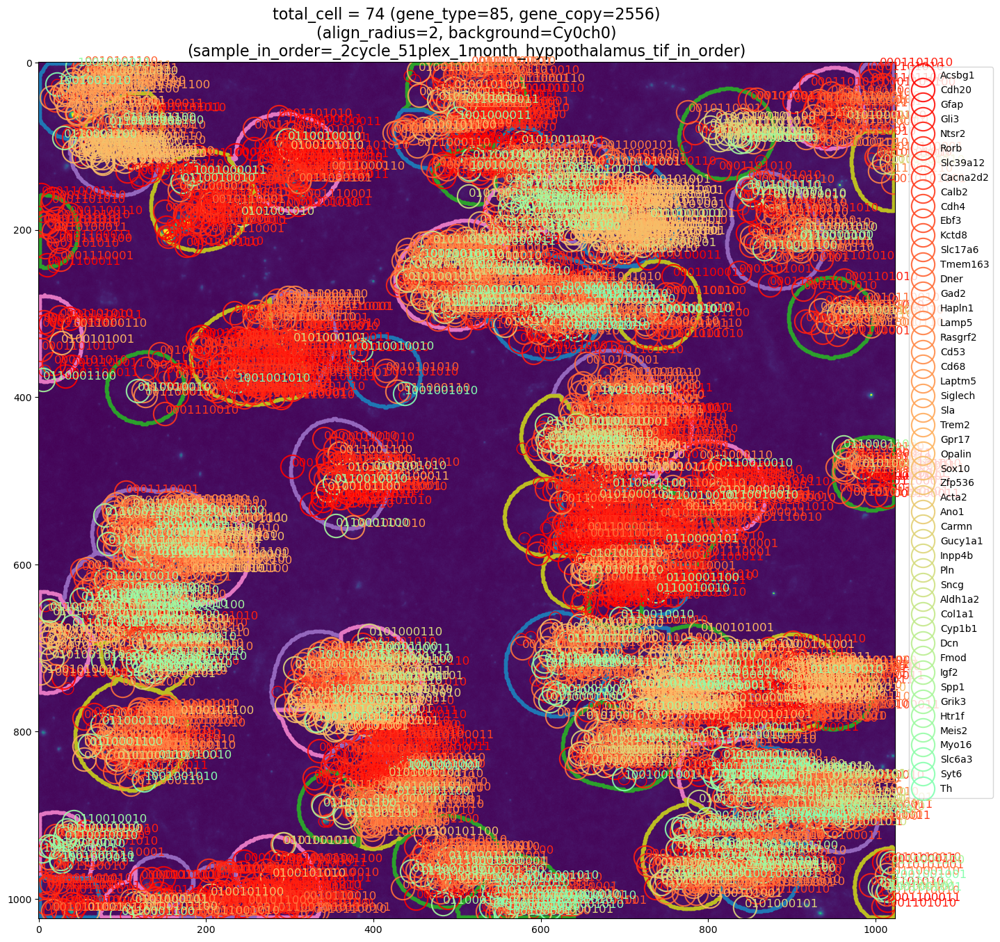

In [23]:
##########################
if __name__ == '__main__':
    #############
    ### kwarg +++
    plt_show_kwarg = {'membrane_marker_size': 6, 'dot_marker_size': 12,
                      'gene_marker_size': 24, 'gene_marker_type': 'o'}
    ### kwarg ---
    #############
    wwwDotMap_._mapping_gene_word_of_total_cell(word_ttt__HD0,
                                                xbit_gene_dict = real_gene_dict,
                                                back_ch_name_list = np.array(ch_name_list)[[0]],
                                                **plt_show_kwarg)
    ##############


In [24]:
##########################
if __name__ == '__main__':
    #############
    ### kwarg +++
    plt_show_kwarg = {'unique_name': '0_bit_error',
                      'marker_type': 'o',
                      'marker_color': 'green',
                      'line_color': 'green', 
                      'log2_scale': False, 
                      'blank_gene_rate': None,
                     }
    ### kwarg ---
    #############
    ooo_error_ttt_order = gene_copy_spectrum(total_wording_bit_Act, 
                                             sample_in_order, file_in_order,
                                             sample_saving_path, 
                                             align_radius,
                                             gene_type_color_dict,
                                             A_ttt = type_copy_ttt__HD0, 
                                             B_ttt = xbit_book,
                                             gene_copy_type = 'per_average',
                                             plt_show = False,
                                             **plt_show_kwarg)
    ##############

,gene_type,copies_per_cell,total_gene_copy,total_gene_cell,total_cell_of_non_zero,copies_per_average,x_bit_error,RNAseq_base,10bit_word,RNAseq_name
0,Acsbg1,3.769,196,52,61,3.21,0_bit_error,10bit_UltraPlex,0001100011,MsBrain_51plex
1,Acta2,1.000,1,1,61,0.02,0_bit_error,10bit_UltraPlex,0100110001,MsBrain_51plex
2,Aldh1a2,1.000,4,4,61,0.07,0_bit_error,10bit_UltraPlex,0101001100,MsBrain_51plex
3,Ano1,1.500,9,6,61,0.15,0_bit_error,10bit_UltraPlex,0100110010,MsBrain_51plex
...,...,...,...,...,...,...,...,...,...,...
81,blank_6,1.000,5,5,61,0.08,0_bit_error,10bit_UltraPlex,0100100101,MsBrain_51plex
82,blank_7,1.500,3,2,61,0.05,0_bit_error,10bit_UltraPlex,0100110100,MsBrain_51plex
83,blank_8,1.000,1,1,61,0.02,0_bit_error,10bit_UltraPlex,0100111000,MsBrain_51plex
84,blank_9,1.333,4,3,61,0.07,0_bit_error,10bit_UltraPlex,0101010100,MsBrain_51plex


,gene_type,copies_per_cell,total_gene_copy,total_gene_cell,total_cell_of_non_zero,...,RNAseq_base,10bit_word,RNAseq_name,percent,std_error_mean
0,Acsbg1,3.769,196,52,61,...,10bit_UltraPlex,0001100011,MsBrain_51plex,7.6%,0.0
1,Acta2,1.0,1,1,61,...,10bit_UltraPlex,0100110001,MsBrain_51plex,0.0%,0.0
2,Aldh1a2,1.0,4,4,61,...,10bit_UltraPlex,0101001100,MsBrain_51plex,0.2%,0.0
3,Ano1,1.5,9,6,61,...,10bit_UltraPlex,0100110010,MsBrain_51plex,0.4%,0.0
4,Cacna2d2,3.571,150,42,61,...,10bit_UltraPlex,0001110010,MsBrain_51plex,5.9%,0.0
...,...,...,...,...,...,...,...,...,...,...,...
80,blank_5,1.0,1,1,61,...,10bit_UltraPlex,0011011000,MsBrain_51plex,0.0%,0.0
81,blank_6,1.0,5,5,61,...,10bit_UltraPlex,0100100101,MsBrain_51plex,0.2%,0.0
82,blank_7,1.5,3,2,61,...,10bit_UltraPlex,0100110100,MsBrain_51plex,0.1%,0.0
83,blank_8,1.0,1,1,61,...,10bit_UltraPlex,0100111000,MsBrain_51plex,0.0%,0.0


## correlation__scRNAseq

In [25]:
### reading from 
# A_name = '8bit_UltraPlex'
# section_name = '_gene_copy_spectrum_{:}_{:}'.format(sample_in_order, A_name)
# table_name = '_{:}_table'.format(section_name)
# file_suffix = '.csv'
# save_path = os.path.join(sample_saving_path, table_name + file_suffix)
# ooo_error_ttt_order = pd.read_csv(save_path)#, dtype = object)
# alva_tool.pd_print(ooo_error_ttt_order, row = 16)

,gene_type,copies_per_cell_x,total_gene_copy_x,total_gene_cell_x,total_cell_of_non_zero_x,copies_per_average_x,x_bit_error,RNAseq_base_x,10bit_word,RNAseq_name_x,percent,std_error_mean_x,copies_per_cell_y,total_gene_copy_y,total_gene_cell_y,std_error_mean_y,total_cell_of_non_zero_y,copies_per_average_y,RNAseq_name_y,RNAseq_base_y
0,Acsbg1,3.769,196,52,61,3.21,0_bit_error,10bit_UltraPlex,0001100011,MsBrain_51plex,7.6%,0.0,3.857,285,74,0,74,3.851,MsBrain_51plex__hypothalamus,10Xenium
1,Acta2,1.000,1,1,61,0.02,0_bit_error,10bit_UltraPlex,0100110001,MsBrain_51plex,0.0%,0.0,0.305,22,74,0,74,0.297,MsBrain_51plex__hypothalamus,10Xenium
2,Aldh1a2,1.000,4,4,61,0.07,0_bit_error,10bit_UltraPlex,0101001100,MsBrain_51plex,0.2%,0.0,0.034,2,74,0,74,0.027,MsBrain_51plex__hypothalamus,10Xenium
3,Ano1,1.500,9,6,61,0.15,0_bit_error,10bit_UltraPlex,0100110010,MsBrain_51plex,0.4%,0.0,0.070,5,74,0,74,0.068,MsBrain_51plex__hypothalamus,10Xenium
4,Cacna2d2,3.571,150,42,61,2.46,0_bit_error,10bit_UltraPlex,0001110010,MsBrain_51plex,5.9%,0.0,1.687,124,74,0,74,1.676,MsBrain_51plex__hypothalamus,10Xenium
5,Calb2,3.324,113,34,61,1.85,0_bit_error,10bit_UltraPlex,0010100011,MsBrain_51plex,4.4%,0.0,7.594,561,74,0,74,7.581,MsBrain_51plex__hypothalamus,10Xenium
6,Carmn,2.833,17,6,61,0.28,0_bit_error,10bit_UltraPlex,0101000011,MsBrain_51plex,0.7%,0.0,0.162,11,74,0,74,0.149,MsBrain_51plex__hypothalamus,10Xenium
7,Cd53,2.500,10,4,61,0.16,0_bit_error,10bit_UltraPlex,0011001001,MsBrain_51plex,0.4%,0.0,0.337,24,74,0,74,0.324,MsBrain_51plex__hypothalamus,10Xenium
8,Cd68,1.308,17,13,61,0.28,0_bit_error,10bit_UltraPlex,0011001010,MsBrain_51plex,0.7%,0.0,0.286,21,74,0,74,0.284,MsBrain_51plex__hypothalamus,10Xenium
9,Cdh20,1.176,20,17,61,0.33,0_bit_error,10bit_UltraPlex,0001100101,MsBrain_51plex,0.8%,0.0,1.284,95,74,0,74,1.284,MsBrain_51plex__hypothalamus,10Xenium


0.272511261222357


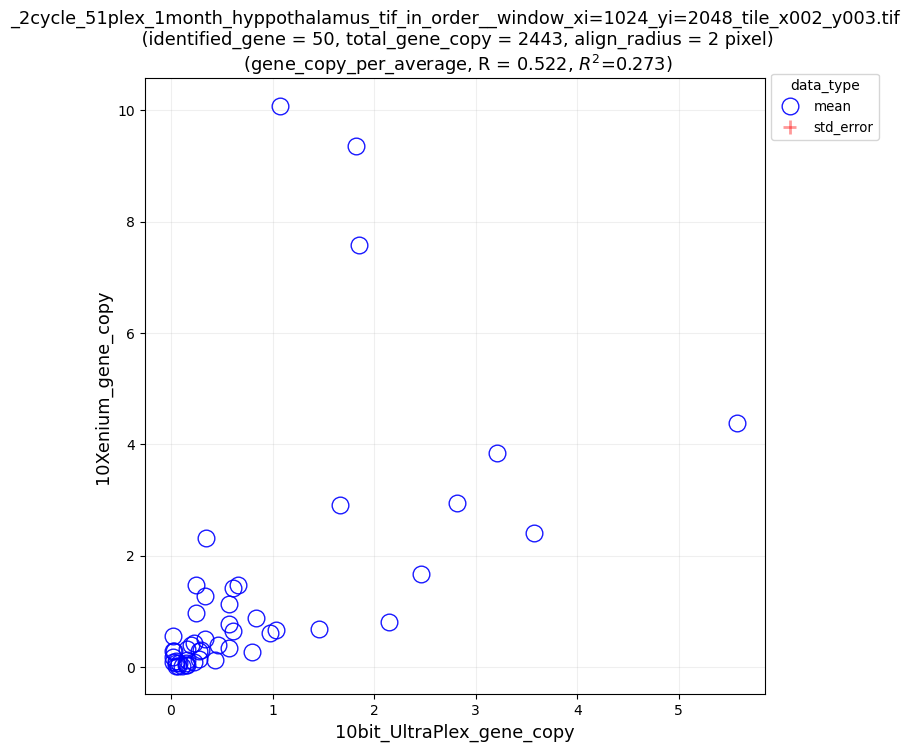

In [26]:
def correlation_between_AB_ttt(sample_in_order, file_in_order,
                               sample_saving_path,
                               A_ttt, B_ttt, 
                               align_radius = None,
                               gene_copy_type = None,
                               **kwargs):
    ### kwargs +++ 
    A_cell_min = kwargs['A_cell_min']
    B_cell_min = kwargs['B_cell_min']
    log2_scale = kwargs['log2_scale']
    ### kwargs ---
    ### setting ---
    if align_radius is None: 
        align_radius = 'none'
    if gene_copy_type is None:
        gene_copy_type = 'per_cell'
    ### setting ---
    A_name = A_ttt['RNAseq_base'].values[0]
    B_name = B_ttt['RNAseq_base'].values[0]
    ############
    section_name = 'correlation_between_{:}_and_{:}_type={:}_tissue={:}_{:}'.format(A_name, B_name,
                                                                                    gene_copy_type, 
                                                                                    sample_in_order, 
                                                                    file_in_order.replace('.', '_'))
    ############
    ### minimum_cell +++
    A_ttt__ = A_ttt[A_ttt['total_gene_cell'] >= A_cell_min]
    B_ttt__ = B_ttt[B_ttt['total_gene_cell'] >= B_cell_min]
    AB_ttt = pd.merge(A_ttt__, B_ttt__, on = 'gene_type', how = 'inner')
    ### minimum_cell ---
    alva_tool.pd_print(AB_ttt, row = 100, column = 100)  
    ###---
    total_copy_x = AB_ttt['total_gene_copy_x'].values
    total_cell_x = AB_ttt['total_gene_cell_x'].values
    UMI_total = total_copy_x / total_cell_x
    UMI_expression = np.log10(1 + UMI_total * 10000)
    #print('UMI_expression =', UMI_expression)
    ###---
    ### plotting
    figure_name = '_coefficient_{:}'.format(section_name)
    file_suffix = '.png'
    save_figure = os.path.join(sample_saving_path, figure_name + file_suffix)
    AlvaFontSize = 16
    wX = 1
    wY = 1
    figure = plt.figure(figsize = (wX*8, wY*8))
    for wn in range(wX*wY):
        if wn == 0:
            window = figure.add_subplot(wY, wX, wn + 1)
            ###
            yy = np.float64(AB_ttt['copies_{:}_y'.format(gene_copy_type)].values)
            xx = np.float64(AB_ttt['copies_{:}_x'.format(gene_copy_type)].values)
            co_ratio = np.corrcoef(xx, yy)[0, 1]
            ##########
            #################
            ### linear_R2 +++
            from sklearn.linear_model import LinearRegression
            xx_2d = xx.reshape(-1, 1)
            linear_model = LinearRegression().fit(xx_2d, yy)
            linear_R2 = linear_model.score(xx_2d, yy)
            print(linear_R2)
            ###
            # import statsmodels.api as sm
            # xx_2d = sm.add_constant(xx)
            # linear_model = sm.OLS(yy, xx_2d)
            # #print(linear_model.fit().summary())
            # R2 = linear_model.fit().rsquared
            # print(R2)
            ### linear_R2 ---
            #################
            window.plot(xx, yy,
                        marker = 'o',
                        markersize = 8+4,
                        markeredgecolor = 'blue',
                        markerfacecolor = 'None', 
                        markeredgewidth = 1,
                        alpha = 0.9, linewidth = 0, 
                        label = 'mean') 
            ###
            window.errorbar(xx, yy,
                            yerr = AB_ttt['std_error_mean_y'],
                            xerr = AB_ttt['std_error_mean_x'],
                            linestyle = '', marker = '',
                            color = 'red', alpha = 0.4, linewidth = 2, 
                            label = 'std_error') 
            ###
            if log2_scale:
                window.set_yscale('log', base = 2)
                window.set_xscale('log', base = 2)
            window.set_ylabel('{:}_gene_copy'.format(B_name), fontsize = AlvaFontSize*0.8)
            window.set_xlabel('{:}_gene_copy'.format(A_name), fontsize = AlvaFontSize*0.8)
            window.set_title('{:}_{:}'.format(sample_in_order, file_in_order) +
            '\n (identified_gene = {:}, '.format(len(xx[xx > 0])) + 
                'total_gene_copy = {:}, '.format(AB_ttt['total_gene_copy_x'].sum()) +
                'align_radius = {:} pixel)'.format(align_radius) +
            '\n (gene_copy_{:}, R = {:}, $R^2$={:})'.format(gene_copy_type, 
                                                            round(co_ratio, 3), round(linear_R2, 3)),
                             fontsize = AlvaFontSize*0.8)
            window.grid(alpha = 0.2)
            window.legend(title = 'data_type', fontsize = AlvaFontSize*0.6, loc = [1.01, 0.9])
    ###
    plt.savefig(save_figure, dpi = 256)
    ##########
    plt.show()
    ##########
    return AB_ttt
    #############
# ##########################
# if __name__ == '__main__':
#     #############
#     ### kwarg +++
#     cell_filter_kwarg = {'A_cell_min': 0.01,
#                          'B_cell_min': 0.01,
#                          'log2_scale': False,}
#     ###
#     correlation_between_AB_ttt(sample_in_order, sample_saving_path,
#                                A_ttt = ooo_error_ttt_order, 
#                                B_ttt = RNAseq_ttt, 
#                                align_radius = align_radius,
#                                gene_copy_type = None,
#                                **cell_filter_kwarg)
#     ### kwarg ---
#     #############
##########################
if __name__ == '__main__':
    #############
    ### kwarg +++
    cell_filter_kwarg = {'A_cell_min': 0.01,
                         'B_cell_min': 0.01,
                         'log2_scale': False,}
    ### kwarg ---
    #############
    correlation_between_AB_ttt(sample_in_order, file_in_order, sample_saving_path,
                               A_ttt = ooo_error_ttt_order, 
                               B_ttt = RNAseq_ttt, 
                               align_radius = align_radius,
                               gene_copy_type = 'per_average',
                               **cell_filter_kwarg)

## blank_gene_ratio

,gene_type,copies_per_cell,total_gene_copy,total_gene_cell,total_cell_of_non_zero,...,RNAseq_base,10bit_word,RNAseq_name,percent,std_error_mean
50,blank_0,1.000,2,2,61,...,10bit_UltraPlex,0001110100,MsBrain_51plex,0.1%,0.0
51,blank_1,1.000,2,2,61,...,10bit_UltraPlex,0001111000,MsBrain_51plex,0.1%,0.0
52,blank_10,1.000,1,1,61,...,10bit_UltraPlex,0101011000,MsBrain_51plex,0.0%,0.0
53,blank_11,1.400,14,10,61,...,10bit_UltraPlex,0110000110,MsBrain_51plex,0.5%,0.0
54,blank_12,1.000,4,4,61,...,10bit_UltraPlex,0110010100,MsBrain_51plex,0.2%,0.0
55,blank_13,1.000,2,2,61,...,10bit_UltraPlex,0110011000,MsBrain_51plex,0.1%,0.0
56,blank_18,1.000,2,2,61,...,10bit_UltraPlex,1000101010,MsBrain_51plex,0.1%,0.0
57,blank_2,1.000,4,4,61,...,10bit_UltraPlex,0010110100,MsBrain_51plex,0.2%,0.0
58,blank_20,1.000,1,1,61,...,10bit_UltraPlex,1000110001,MsBrain_51plex,0.0%,0.0
59,blank_21,1.000,3,3,61,...,10bit_UltraPlex,1000110010,MsBrain_51plex,0.1%,0.0


blank_gene_copy = 113
total_gene_copy = 2556
blank_gene_ratio = 0.044209702660406885


,gene_type,copies_per_cell,total_gene_copy,total_gene_cell,total_cell_of_non_zero,copies_per_average,x_bit_error,RNAseq_base,10bit_word,RNAseq_name
0,Acsbg1,3.769,196,52,61,3.21,0_bit_error,10bit_UltraPlex,0001100011,MsBrain_51plex
1,Acta2,1.000,1,1,61,0.02,0_bit_error,10bit_UltraPlex,0100110001,MsBrain_51plex
2,Aldh1a2,1.000,4,4,61,0.07,0_bit_error,10bit_UltraPlex,0101001100,MsBrain_51plex
3,Ano1,1.500,9,6,61,0.15,0_bit_error,10bit_UltraPlex,0100110010,MsBrain_51plex
...,...,...,...,...,...,...,...,...,...,...
81,blank_6,1.000,5,5,61,0.08,0_bit_error,10bit_UltraPlex,0100100101,MsBrain_51plex
82,blank_7,1.500,3,2,61,0.05,0_bit_error,10bit_UltraPlex,0100110100,MsBrain_51plex
83,blank_8,1.000,1,1,61,0.02,0_bit_error,10bit_UltraPlex,0100111000,MsBrain_51plex
84,blank_9,1.333,4,3,61,0.07,0_bit_error,10bit_UltraPlex,0101010100,MsBrain_51plex


,gene_type,copies_per_cell,total_gene_copy,total_gene_cell,total_cell_of_non_zero,...,RNAseq_base,10bit_word,RNAseq_name,percent,std_error_mean
0,Acsbg1,3.769,196,52,61,...,10bit_UltraPlex,0001100011,MsBrain_51plex,7.6%,0.0
1,Acta2,1.0,1,1,61,...,10bit_UltraPlex,0100110001,MsBrain_51plex,0.0%,0.0
2,Aldh1a2,1.0,4,4,61,...,10bit_UltraPlex,0101001100,MsBrain_51plex,0.2%,0.0
3,Ano1,1.5,9,6,61,...,10bit_UltraPlex,0100110010,MsBrain_51plex,0.4%,0.0
4,Cacna2d2,3.571,150,42,61,...,10bit_UltraPlex,0001110010,MsBrain_51plex,5.9%,0.0
...,...,...,...,...,...,...,...,...,...,...,...
80,blank_5,1.0,1,1,61,...,10bit_UltraPlex,0011011000,MsBrain_51plex,0.0%,0.0
81,blank_6,1.0,5,5,61,...,10bit_UltraPlex,0100100101,MsBrain_51plex,0.2%,0.0
82,blank_7,1.5,3,2,61,...,10bit_UltraPlex,0100110100,MsBrain_51plex,0.1%,0.0
83,blank_8,1.0,1,1,61,...,10bit_UltraPlex,0100111000,MsBrain_51plex,0.0%,0.0


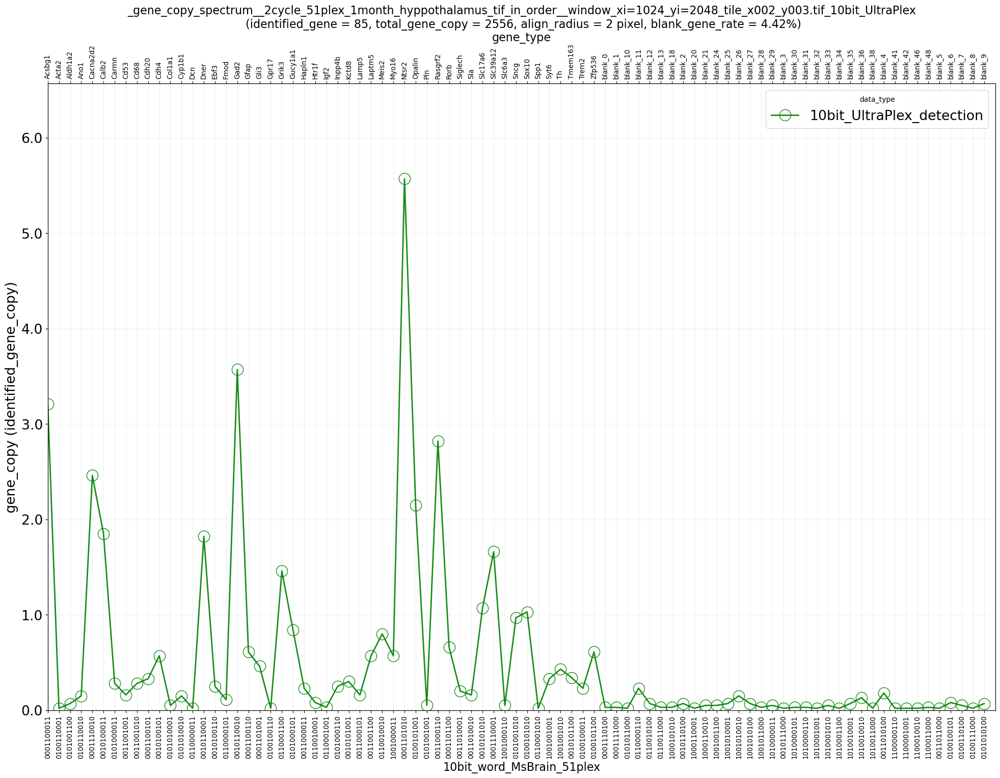

In [27]:
##########################
if __name__ == '__main__':
##################
    if blank_gene_demo:
        blank_ooo_ttt = pd.DataFrame.copy(ooo_error_ttt_order[
                                          ooo_error_ttt_order['gene_type'].str.contains('blank')])
        alva_tool.pd_print(blank_ooo_ttt, row = 100)
        total_gene_copy = ooo_error_ttt_order['total_gene_copy'].values.sum()
        blank_gene_copy = blank_ooo_ttt['total_gene_copy'].values.sum()
        blank_gene_ratio = blank_gene_copy / total_gene_copy
        print('blank_gene_copy =', blank_gene_copy)
        print('total_gene_copy =', total_gene_copy)
        print('blank_gene_ratio =', blank_gene_ratio)
##########################
if __name__ == '__main__':
    #############
    ### kwarg +++
    plt_show_kwarg = {'unique_name': '0_bit_error',
                      'marker_type': 'o',
                      'marker_color': 'green',
                      'line_color': 'green', 
                      'log2_scale': False,
                      'blank_gene_rate': round(blank_gene_ratio*100, 2),
                     }
    ### kwarg ---
    #############
    ooo_error_ttt_order = gene_copy_spectrum(total_wording_bit_Act, 
                                             sample_in_order, file_in_order,
                                             sample_saving_path, 
                                             align_radius,
                                             gene_type_color_dict,
                                             A_ttt = type_copy_ttt__HD0, 
                                             B_ttt = xbit_book,
                                             gene_copy_type = 'per_average',
                                             **plt_show_kwarg)

## Correlation_analysis

,gene_type,copies_per_cell_x,total_gene_copy_x,total_gene_cell_x,total_cell_of_non_zero_x,copies_per_average_x,x_bit_error,RNAseq_base_x,10bit_word_x,RNAseq_name,percent_x,std_error_mean_x,copies_per_cell_y,total_gene_copy_y,total_gene_cell_y,std_error_mean_y,total_cell_of_non_zero_y,copies_per_average_y,RNAseq_name_x,RNAseq_base_y,10bit_word_y,RNAseq_name_y,percent_y
0,Acsbg1,3.769,196,52,61,3.21,0_bit_error,10bit_UltraPlex,0001100011,MsBrain_51plex,7.6%,0.0,3.857,285,74,0,74,3.851,MsBrain_51plex__hypothalamus,10Xenium,0001100011,MsBrain_51plex,5.8%
1,Acta2,1.000,1,1,61,0.02,0_bit_error,10bit_UltraPlex,0100110001,MsBrain_51plex,0.0%,0.0,0.305,22,74,0,74,0.297,MsBrain_51plex__hypothalamus,10Xenium,0100110001,MsBrain_51plex,0.4%
2,Aldh1a2,1.000,4,4,61,0.07,0_bit_error,10bit_UltraPlex,0101001100,MsBrain_51plex,0.2%,0.0,0.034,2,74,0,74,0.027,MsBrain_51plex__hypothalamus,10Xenium,0101001100,MsBrain_51plex,0.0%
3,Ano1,1.500,9,6,61,0.15,0_bit_error,10bit_UltraPlex,0100110010,MsBrain_51plex,0.4%,0.0,0.070,5,74,0,74,0.068,MsBrain_51plex__hypothalamus,10Xenium,0100110010,MsBrain_51plex,0.1%
4,Cacna2d2,3.571,150,42,61,2.46,0_bit_error,10bit_UltraPlex,0001110010,MsBrain_51plex,5.9%,0.0,1.687,124,74,0,74,1.676,MsBrain_51plex__hypothalamus,10Xenium,0001110010,MsBrain_51plex,2.5%
5,Calb2,3.324,113,34,61,1.85,0_bit_error,10bit_UltraPlex,0010100011,MsBrain_51plex,4.4%,0.0,7.594,561,74,0,74,7.581,MsBrain_51plex__hypothalamus,10Xenium,0010100011,MsBrain_51plex,11.4%
6,Carmn,2.833,17,6,61,0.28,0_bit_error,10bit_UltraPlex,0101000011,MsBrain_51plex,0.7%,0.0,0.162,11,74,0,74,0.149,MsBrain_51plex__hypothalamus,10Xenium,0101000011,MsBrain_51plex,0.2%
7,Cd53,2.500,10,4,61,0.16,0_bit_error,10bit_UltraPlex,0011001001,MsBrain_51plex,0.4%,0.0,0.337,24,74,0,74,0.324,MsBrain_51plex__hypothalamus,10Xenium,0011001001,MsBrain_51plex,0.5%
8,Cd68,1.308,17,13,61,0.28,0_bit_error,10bit_UltraPlex,0011001010,MsBrain_51plex,0.7%,0.0,0.286,21,74,0,74,0.284,MsBrain_51plex__hypothalamus,10Xenium,0011001010,MsBrain_51plex,0.4%
9,Cdh20,1.176,20,17,61,0.33,0_bit_error,10bit_UltraPlex,0001100101,MsBrain_51plex,0.8%,0.0,1.284,95,74,0,74,1.284,MsBrain_51plex__hypothalamus,10Xenium,0001100101,MsBrain_51plex,1.9%


,gene_type,copies_per_cell_x,total_gene_copy_x,total_gene_cell_x,total_cell_of_non_zero_x,...,RNAseq_name_x,RNAseq_base_y,10bit_word_y,RNAseq_name_y,percent_y
0,Acsbg1,3.769,196,52,61,...,MsBrain_51plex__hypothalamus,10Xenium,1100011,MsBrain_51plex,5.8%
1,Acta2,1.000,1,1,61,...,MsBrain_51plex__hypothalamus,10Xenium,100110001,MsBrain_51plex,0.4%
2,Aldh1a2,1.000,4,4,61,...,MsBrain_51plex__hypothalamus,10Xenium,101001100,MsBrain_51plex,0.0%
3,Ano1,1.500,9,6,61,...,MsBrain_51plex__hypothalamus,10Xenium,100110010,MsBrain_51plex,0.1%
4,Cacna2d2,3.571,150,42,61,...,MsBrain_51plex__hypothalamus,10Xenium,1110010,MsBrain_51plex,2.5%
...,...,...,...,...,...,...,...,...,...,...,...
45,Syt6,2.000,20,10,61,...,MsBrain_51plex__hypothalamus,10Xenium,1001001001,MsBrain_51plex,0.8%
46,Th,2.889,26,9,61,...,MsBrain_51plex__hypothalamus,10Xenium,1001001010,MsBrain_51plex,0.2%
47,Tmem163,1.500,21,14,61,...,MsBrain_51plex__hypothalamus,10Xenium,10101100,MsBrain_51plex,3.5%
48,Trem2,1.750,14,8,61,...,MsBrain_51plex__hypothalamus,10Xenium,100100011,MsBrain_51plex,0.7%


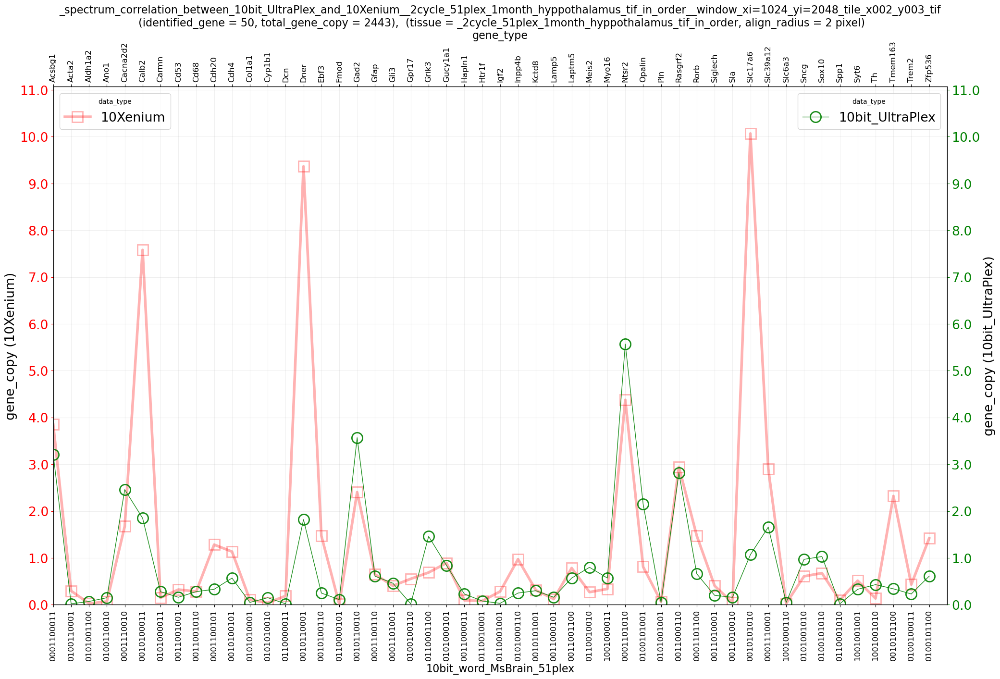

,gene_type,copies_per_cell_x,total_gene_copy_x,total_gene_cell_x,total_cell_of_non_zero_x,copies_per_average_x,x_bit_error,RNAseq_base_x,10bit_word_x,RNAseq_name,percent_x,std_error_mean_x,copies_per_cell_y,total_gene_copy_y,total_gene_cell_y,std_error_mean_y,total_cell_of_non_zero_y,copies_per_average_y,RNAseq_name_x,RNAseq_base_y,10bit_word_y,RNAseq_name_y,percent_y
0,Acsbg1,3.769,196,52,61,3.21,0_bit_error,10bit_UltraPlex,0001100011,MsBrain_51plex,7.6%,0.0,3.857,285,74,0,74,3.851,MsBrain_51plex__hypothalamus,10Xenium,0001100011,MsBrain_51plex,5.8%
1,Acta2,1.000,1,1,61,0.02,0_bit_error,10bit_UltraPlex,0100110001,MsBrain_51plex,0.0%,0.0,0.305,22,74,0,74,0.297,MsBrain_51plex__hypothalamus,10Xenium,0100110001,MsBrain_51plex,0.4%
2,Aldh1a2,1.000,4,4,61,0.07,0_bit_error,10bit_UltraPlex,0101001100,MsBrain_51plex,0.2%,0.0,0.034,2,74,0,74,0.027,MsBrain_51plex__hypothalamus,10Xenium,0101001100,MsBrain_51plex,0.0%
3,Ano1,1.500,9,6,61,0.15,0_bit_error,10bit_UltraPlex,0100110010,MsBrain_51plex,0.4%,0.0,0.070,5,74,0,74,0.068,MsBrain_51plex__hypothalamus,10Xenium,0100110010,MsBrain_51plex,0.1%
4,Cacna2d2,3.571,150,42,61,2.46,0_bit_error,10bit_UltraPlex,0001110010,MsBrain_51plex,5.9%,0.0,1.687,124,74,0,74,1.676,MsBrain_51plex__hypothalamus,10Xenium,0001110010,MsBrain_51plex,2.5%
5,Calb2,3.324,113,34,61,1.85,0_bit_error,10bit_UltraPlex,0010100011,MsBrain_51plex,4.4%,0.0,7.594,561,74,0,74,7.581,MsBrain_51plex__hypothalamus,10Xenium,0010100011,MsBrain_51plex,11.4%
6,Carmn,2.833,17,6,61,0.28,0_bit_error,10bit_UltraPlex,0101000011,MsBrain_51plex,0.7%,0.0,0.162,11,74,0,74,0.149,MsBrain_51plex__hypothalamus,10Xenium,0101000011,MsBrain_51plex,0.2%
7,Cd53,2.500,10,4,61,0.16,0_bit_error,10bit_UltraPlex,0011001001,MsBrain_51plex,0.4%,0.0,0.337,24,74,0,74,0.324,MsBrain_51plex__hypothalamus,10Xenium,0011001001,MsBrain_51plex,0.5%
8,Cd68,1.308,17,13,61,0.28,0_bit_error,10bit_UltraPlex,0011001010,MsBrain_51plex,0.7%,0.0,0.286,21,74,0,74,0.284,MsBrain_51plex__hypothalamus,10Xenium,0011001010,MsBrain_51plex,0.4%
9,Cdh20,1.176,20,17,61,0.33,0_bit_error,10bit_UltraPlex,0001100101,MsBrain_51plex,0.8%,0.0,1.284,95,74,0,74,1.284,MsBrain_51plex__hypothalamus,10Xenium,0001100101,MsBrain_51plex,1.9%


0.272511261222357


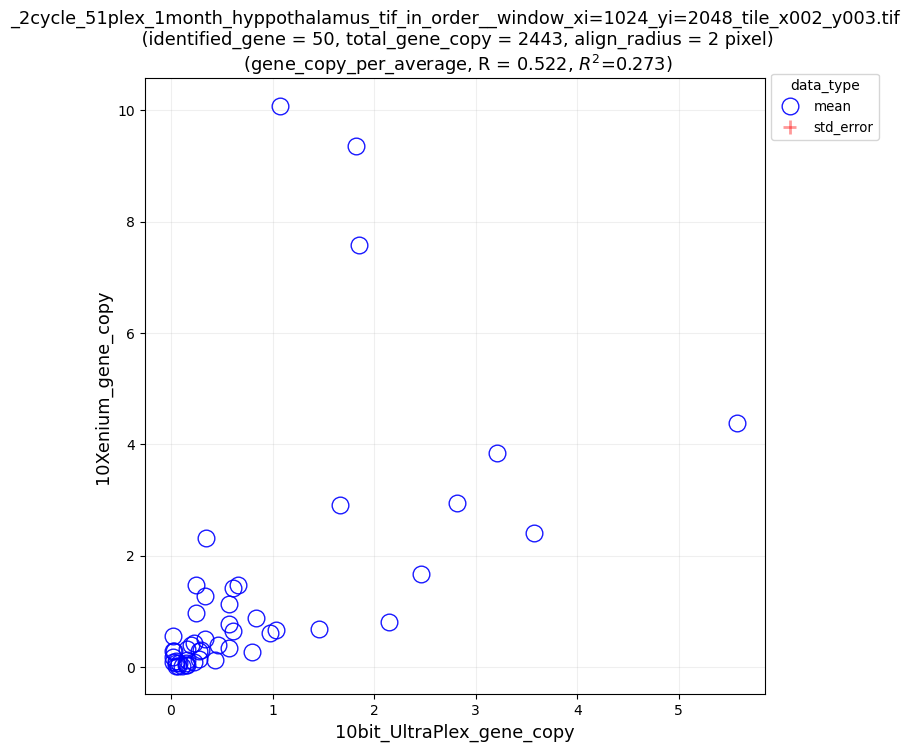

In [28]:
def gene_copy_spectrum_correlation(total_wording_bit_Act, 
                                   sample_in_order, file_in_order,
                                   sample_saving_path, align_radius,
                                   gene_xbit_dict,
                                   A_ttt, 
                                   B_ttt,
                                   gene_copy_type = None,
                                   **kwarg):
    ### setting ---
    if gene_copy_type is None:
        gene_copy_type = 'per_cell'
    ### setting ---
    #############
    ### kwarg +++
    marker_type_A = kwarg['marker_type_A']
    marker_type_B = kwarg['marker_type_B']
    marker_color_A = kwarg['marker_color_A']
    marker_color_B = kwarg['marker_color_B']
    xtick_label_size = kwarg['xtick_label_size']
    ### 
    A_cell_min = kwarg['A_cell_min']
    B_cell_min = kwarg['B_cell_min']
    log2_scale = kwarg['log2_scale']
    ### kwargs ---
    A_name = A_ttt['RNAseq_base'].values[0]
    B_name = B_ttt['RNAseq_base'].values[0]
    ############
    section_name = '_spectrum_correlation_between_{:}_and_{:}_{:}_{:}'.format(A_name, B_name,
                                                                              sample_in_order, 
                                                                              file_in_order.replace('.', '_'))
    ############
    ### minimum_cell +++
    A_ttt__ = A_ttt[A_ttt['total_gene_cell'] >= A_cell_min]
    B_ttt__ = B_ttt[B_ttt['total_gene_cell'] >= B_cell_min]
    AB_ttt__ = pd.merge(A_ttt__, B_ttt__, on = 'gene_type', how = 'inner')
    ### minimum_cell ---
    alva_tool.pd_print(AB_ttt__, row = 100, column = 100)  
    type_aaa__ = AB_ttt__['gene_type'].values
    word_aaa__ = AB_ttt__['{:}bit_word_x'.format(total_wording_bit_Act)].values
    ############
    #################
    ### dot_table +++
    table_name = '_{:}_table'.format(section_name)
    file_suffix = '.csv'
    save_path = os.path.join(sample_saving_path, table_name + file_suffix)
    AB_ttt__.to_csv(save_path, index = False)
    ###
    ttt = pd.read_csv(save_path)#, dtype = object)
    alva_tool.pd_print(ttt, row = 16)
    ### dot_table ---
    #################
    copy_aaa_y = AB_ttt__['copies_{:}_y'.format(gene_copy_type)].values
    copy_aaa_x = AB_ttt__['copies_{:}_x'.format(gene_copy_type)].values
    yy_max__ = np.max([copy_aaa_y, copy_aaa_x])
    ############
    ### plotting
    figure_name = '_spectrum_{:}'.format(section_name)
    file_suffix = '.png'
    save_figure = os.path.join(sample_saving_path, figure_name + file_suffix)
    AlvaFontSize = 16
    wX = 1
    wY = 1
    figure = plt.figure(figsize = (wX*24, wY*14))
    for wn in range(wX*wY):
        if wn == 0:
            window = figure.add_subplot(wY, wX, wn + 1)
            ###----------------------------------------
            copy_aaa__ = AB_ttt__['copies_{:}_y'.format(gene_copy_type)].values
            ###
            xx = np.arange(len(word_aaa__))
            yy = copy_aaa__
            window.plot(xx, yy, 
                        marker = marker_type_B,
                        markersize = 8+8,
                        markeredgecolor = marker_color_B,
                        markerfacecolor = 'None', 
                        markeredgewidth = 2,
                        alpha = 0.3, linewidth = 4, color = 'red',
                        label = '{:}'.format(B_name))
            ###
            window.set_xlim(0, len(xx))
            window.set_xticks(np.arange(len(xx)))
            window.set_xticklabels(labels = word_aaa__, fontsize = xtick_label_size, rotation = 90) 
            window.set_xlabel('{:}bit_word_{:}'.format(total_wording_bit_Act, tissue_name_RNAseq),
                              fontsize = AlvaFontSize) 
            ##############################################
            #ytick_aaa = np.round(np.arange(np.floor(yy.min()), yy.max()+1, 1), 1)
            ytick_aaa = np.round(np.arange(np.floor(yy.min()), yy_max__+1, 1), 1)
            ytick_label_aaa = np.round(ytick_aaa, 0).astype(str)
            if yy.max() >= 32:
                #####################
                ### electing_tick +++
                keep_aaa__ = np.arange(yy.min(), yy.max()+10, 10)
                keep_aaa = np.round(keep_aaa__, 1).astype(str)
                #keep_aaa = np.append(keep_aaa, str(yy.max()))
                for i in range(len(ytick_aaa)):
                    if str(ytick_aaa[i]) not in keep_aaa:
                        ytick_label_aaa[i] = ''
                ### electing_tick ---
                #####################
            window.tick_params(axis = 'y', colors = 'red')
            window.set_yticks(ytick_aaa)
            window.set_yticklabels(labels = ytick_label_aaa, fontsize = AlvaFontSize*1.2) 
            ###
            if log2_scale: 
                window.set_yscale('log', base = 2)
                window.set_ylim(1, 1024)
            else:
                #window.set_ylim(0, yy.max() + 1)
                window.set_ylim(0, yy_max__ + 1)
            ###
            ##############################################
            window.set_ylabel('gene_copy ({:})'.format(B_name), fontsize = AlvaFontSize*1.2) 
            window.legend(title = 'data_type', fontsize = AlvaFontSize*1.2, loc = 'upper left')
            ###
            ###
            ax2 = window.twiny()
            ax2.set_xlim(0, len(xx))
            ax2.set_xticks(np.arange(len(xx)))
            ax2.set_xticklabels(labels = type_aaa__, fontsize = xtick_label_size, rotation = 90) 
            ax2.set_xlabel('gene_type'.format(total_wording_bit_Act), fontsize = AlvaFontSize)
            ###
            ###
            ###----------------------------------------
            ###----------------------------------------
            copy_aaa__ = AB_ttt__['copies_{:}_x'.format(gene_copy_type)].values
            ###
            xx = np.arange(len(word_aaa__))
            yy = copy_aaa__
            ###
            ay2 = window.twinx()
            ###
            ay2.plot(xx, yy, 
                        marker = marker_type_A,
                        markersize = 8+8,
                        markeredgecolor = marker_color_A,
                        markerfacecolor = 'None', 
                        markeredgewidth = 2,
                        alpha = 0.9, linewidth = 1, color = 'green',
                        label = '{:}'.format(A_name))
            ##############################################
            #ytick_aaa = np.round(np.arange(np.floor(yy.min()), yy.max()+1, 1), 1)
            ytick_aaa = np.round(np.arange(np.floor(yy.min()), yy_max__+1, 1), 1)
            ytick_label_aaa = np.round(ytick_aaa, 0).astype(str)
            if yy.max() >= 32:
                #####################
                ### electing_tick +++
                keep_aaa__ = np.arange(yy.min(), yy.max()+1, 4)
                keep_aaa = np.round(keep_aaa__, 1).astype(str)
                #keep_aaa = np.append(keep_aaa, str(yy.max()))
                for i in range(len(ytick_aaa)):
                    if str(ytick_aaa[i]) not in keep_aaa:
                        ytick_label_aaa[i] = ''
                ### electing_tick ---
                #####################
            ay2.tick_params(axis = 'y', colors = 'green')
            ay2.set_yticks(ytick_aaa)
            ay2.set_yticklabels(labels = ytick_label_aaa, fontsize = AlvaFontSize*1.2) 
            ###
            if log2_scale: 
                ay2.set_yscale('log', base = 2)
                ay2.set_ylim(1, 1024)
            else:
                #ay2.set_ylim(0, yy.max() + 1)
                ay2.set_ylim(0, yy_max__ + 1)
            ###
            ##############################################
            ay2.set_ylabel('gene_copy ({:})'.format(A_name), fontsize = AlvaFontSize*1.2) 
            ay2.legend(title = 'data_type', fontsize = AlvaFontSize*1.2, loc = 'upper right')
            ###----------------------------------------
            ###
            window.set_title('{:}'.format(section_name) +
            '\n (identified_gene = {:}, '.format(len(copy_aaa__[copy_aaa__ > 0])) + 
            'total_gene_copy = {:}), '.format(AB_ttt__['total_gene_copy_x'].sum()) +
            ' (tissue = {:}, align_radius = {:} pixel)'.format(sample_in_order, align_radius),
                             fontsize = AlvaFontSize)
            ###
            window.grid(alpha = 0.2)
    ###
    plt.savefig(save_figure, dpi = 256)
    ##########
    plt.show()
    ##########
    ##########################
    correlation_between_AB_ttt(sample_in_order, file_in_order,
                               sample_saving_path,
                               A_ttt = A_ttt, 
                               B_ttt = B_ttt, 
                               align_radius = align_radius,
                               gene_copy_type = gene_copy_type,
                               **kwarg)
    ####################################
# ##########################
# if __name__ == '__main__':
#     if '_51plex' in sample_in_order:
#         plt_log2_scale = False
#     #############
#     ### kwarg +++
#     plt_show_kwarg = {'marker_type_A': 'o',
#                       'marker_type_B': 's',
#                       'marker_color_A': 'green',
#                       'marker_color_B': 'red',
#                       'xtick_label_size': 16,
#                      }
#     cell_filter_kwarg = {'A_cell_min': 1,
#                          'B_cell_min': 1,
#                          'log2_scale': plt_log2_scale,
#                         }
#     cell_filter_kwarg.update(plt_show_kwarg)
#     ###
#     gene_copy_spectrum_correlation(total_wording_bit_Act, sample_in_order, sample_saving_path, align_radius,
#                                    gene_xbit_dict,
#                                    A_ttt = ooo_error_ttt_order,  
#                                    B_ttt = RNAseq_ttt_order,
#                                    gene_copy_type = None,
#                                    **cell_filter_kwarg)
#     ### kwarg ---
#     #############
##########################
if __name__ == '__main__':
    #############
    ### kwarg +++
    plt_show_kwarg = {'marker_type_A': 'o',
                      'marker_type_B': 's',
                      'marker_color_A': 'green',
                      'marker_color_B': 'red',
                      'xtick_label_size': 12,
                     }
    cell_filter_kwarg = {'A_cell_min': 0.01,
                         'B_cell_min': 0.01,
                         'log2_scale': False,
                        }
    cell_filter_kwarg.update(plt_show_kwarg)
    ### kwarg ---
    #############
    gene_copy_spectrum_correlation(total_wording_bit_Act, 
                                   sample_in_order, file_in_order,
                                   sample_saving_path, align_radius,
                                   gene_xbit_dict,
                                   A_ttt = ooo_error_ttt_order,  
                                   B_ttt = RNAseq_ttt_order,
                                   gene_copy_type = 'per_average',
                                   **cell_filter_kwarg)


,gene_type,copies_per_cell,10bit_word,0_bit_error_word,word_yy,word_xx,RNAseq_base,cell_id
0,Gfap,1,['0001100110'],['0001100110'],89.00,42.00,10bit_UltraPlex,1
1,Rorb,1,['0001101100'],['0001101100'],12.00,54.00,10bit_UltraPlex,1
2,Cacna2d2,1,['0001110010'],['0001110010'],45.25,19.75,10bit_UltraPlex,1
3,Cacna2d2,1,['0001110010'],['0001110010'],88.00,33.00,10bit_UltraPlex,1
4,Tmem163,1,['0010101100'],['0010101100'],2.50,55.00,10bit_UltraPlex,1
...,...,...,...,...,...,...,...,...
2551,Rasgrf2,1,['0011000110'],['0011000110'],1002.00,111.00,10bit_UltraPlex,74
2552,Rasgrf2,1,['0011000110'],['0011000110'],1004.00,123.50,10bit_UltraPlex,74
2553,Zfp536,1,['0100101100'],['0100101100'],1013.00,126.00,10bit_UltraPlex,74
2554,Gucy1a1,1,['0101000101'],['0101000101'],1005.00,115.00,10bit_UltraPlex,74


,gene_type,cell_1,cell_2,cell_3,cell_4,...,cell_70,cell_71,cell_72,cell_73,cell_74
0,Acsbg1,0.0,10.0,0.0,0.0,...,2.0,3.0,0.0,6.0,0.0
1,Acta2,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0
2,Aldh1a2,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0
3,Ano1,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0
4,Cacna2d2,2.0,5.0,0.0,5.0,...,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
45,Syt6,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0
46,Th,1.0,0.0,0.0,0.0,...,0.0,0.0,10.0,0.0,0.0
47,Tmem163,1.0,2.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0
48,Trem2,5.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0


raw_pixel_y, raw_pixel_x = 74 50


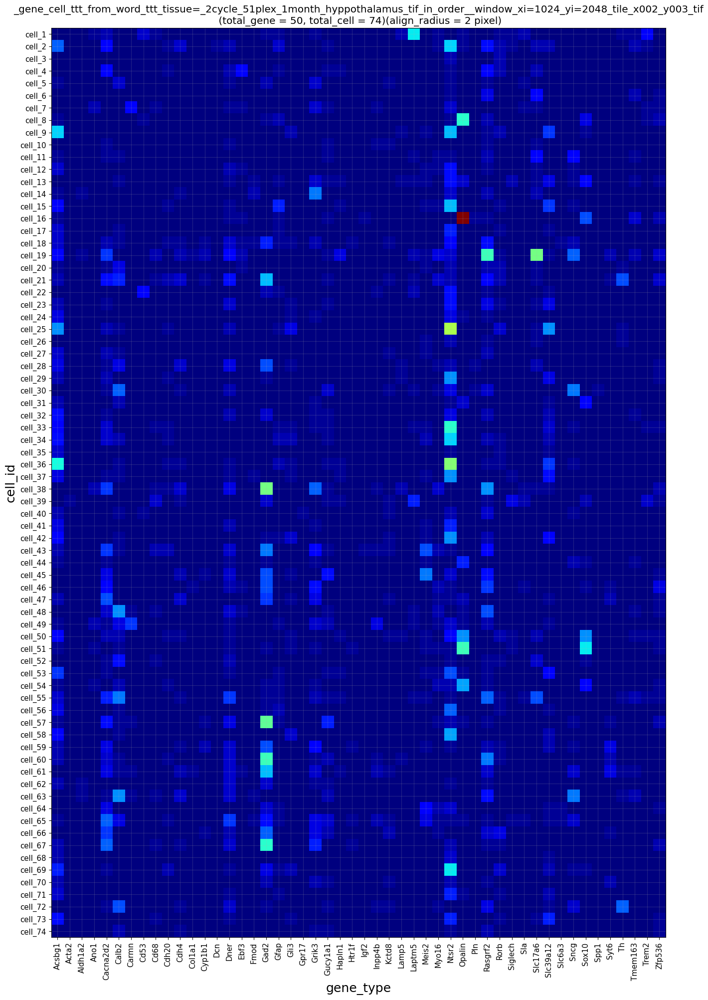

,gene_type,cell_1,cell_2,cell_3,cell_4,...,cell_70,cell_71,cell_72,cell_73,cell_74
0,Acsbg1,0.0,10.0,0.0,0.0,...,2.0,3.0,0.0,6.0,0.0
1,Acta2,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0
2,Aldh1a2,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0
3,Ano1,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0
4,Cacna2d2,2.0,5.0,0.0,5.0,...,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
45,Syt6,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0
46,Th,1.0,0.0,0.0,0.0,...,0.0,0.0,10.0,0.0,0.0
47,Tmem163,1.0,2.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0
48,Trem2,5.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0


In [29]:
def gene_cell_ttt_from_word_ttt(word_ttt):
    ############
    section_name = '_gene_cell_ttt_from_word_ttt_tissue={:}_{:}'.format(sample_in_order,
                                                                        file_in_order.replace('.', '_'))
    ############
    ###
    ttt__ = word_ttt[['gene_type', 'cell_id']].copy()
    ttt = ttt__.groupby(by = ['gene_type'])['cell_id'].apply(list).reset_index(name = 'cell_id_group')
    ###
    gene_aaa = np.unique(ttt__['gene_type'].values)
    cell_aaa = np.unique(ttt__['cell_id'].values)
    ###
    cell_id_list = []
    mass_id_list = [] 
    gene_cell_ttt_list = []
    for gene_i in gene_aaa:
        cell_id_aaa = ttt[ttt['gene_type'].values == gene_i]['cell_id_group'].values[0]                 
        cell_id, mass_id = np.unique(cell_id_aaa, return_counts = True)  
        ###
        cell_id_name = np.zeros([len(cell_id)], dtype = object)
        cell_id_name[:] =  'cell_'
        cell_id_name = cell_id_name + cell_id.astype(str)
        gene_cell_name = np.append(['gene_type'], cell_id_name)
        gene_cell_ttt_i = pd.DataFrame(columns = gene_cell_name)
        ###
        gene_cell_ttt_i['gene_type'] = [gene_i]
        gene_cell_ttt_i[cell_id_name] = mass_id
        #alva_tool.pd_print(gene_cell_ttt_i)
        ###
        gene_cell_ttt_list.append(gene_cell_ttt_i)
        ###
    gene_cell_ttt__ = pd.concat(gene_cell_ttt_list, ignore_index = True)
    #alva_tool.pd_print(gene_cell_ttt__)
    ###
    cell_aaa = np.unique(ttt__['cell_id'].values).astype(str)
    cell_id_name = np.zeros([len(cell_aaa)], dtype = object)
    cell_id_name[:] =  'cell_'
    cell_id_name = cell_id_name + cell_aaa
    gene_cell_name_in_order = np.append(['gene_type'], cell_id_name)
    ###
    gene_cell_ttt_in_order__ = gene_cell_ttt__[gene_cell_name_in_order].fillna(0)
    ###
    #################
    ### dot_table +++
    table_name = '_{:}_table'.format(section_name)
    file_suffix = '.csv'
    save_path = os.path.join(sample_saving_path, table_name + file_suffix)
    gene_cell_ttt_in_order__.to_csv(save_path, index = False)
    ###
    gene_cell_ttt_in_order = pd.read_csv(save_path)#, dtype = object)
    alva_tool.pd_print(gene_cell_ttt_in_order, row = 16)
    ### dot_table ---
    #################
    ######################################
    ### gene_cell_mmm or cell_gene_mmm +++
    gene_aaa__ = gene_cell_ttt_in_order['gene_type'].values
    cell_aaa__ = gene_cell_ttt_in_order.columns[1:].values
    if len(gene_aaa__) > len(cell_aaa__):
        ### gene_cell_mmm 
        mmm = gene_cell_ttt_in_order.iloc[:, 1:].values
        yy = gene_aaa__
        xx = cell_aaa__
    else:
        ### cell_gene_mmm 
        mmm = gene_cell_ttt_in_order.iloc[:, 1:].values.T
        yy = cell_aaa__
        xx = gene_aaa__
    ### gene_cell_mmm or cell_gene_mmm ---
    ######################################
    ############
    ### plotting
    figure_name = '_map_{:}'.format(section_name)
    file_suffix = '.png'
    save_figure = os.path.join(sample_saving_path, figure_name + file_suffix)
    AlvaFontSize = 18
    wX = 1
    wY = 1
    wxx = 16 # window_width
    raw_pixel_y, raw_pixel_x = mmm.shape
    print('raw_pixel_y, raw_pixel_x =', raw_pixel_y, raw_pixel_x)
    figure = plt.figure(figsize = (wX*wxx, wY*wxx*(raw_pixel_y / raw_pixel_x)))
    for wn in range(wX*wY):
        if wn == 0:
            window = figure.add_subplot(wY, wX, wn + 1)
            ###----------------------------------------
            window.imshow(mmm, cmap = 'jet')
            ###
            window.set_yticks(np.arange(len(yy)))
            window.set_yticklabels(labels = yy, fontsize = AlvaFontSize*0.6, rotation = 0) 
            window.set_ylabel('cell_id', fontsize = AlvaFontSize) 
            ###
            xtick_aaa = np.arange(len(xx)).astype(np.int64)
            xtick_label_aaa = xx.astype(str)
            window.set_xticks(xtick_aaa)
            window.set_xticklabels(labels = xtick_label_aaa, fontsize = AlvaFontSize*0.6, rotation = 90)  
            window.set_xlabel('gene_type', fontsize = AlvaFontSize) 
            ###
            window.set_title('{:}'.format(section_name) +
            '\n (total_gene = {:}, '.format(len(gene_aaa__)) + 'total_cell = {:})'.format(len(cell_aaa__)) +
            '(align_radius = {:} pixel)'.format(align_radius),
                             fontsize = AlvaFontSize*0.8)
            ###
            window.grid(alpha = 0.2)
    ###
    plt.savefig(save_figure, dpi = 256)
    ##########
    plt.show()
    ##########
    return gene_cell_ttt_in_order
    ####################
##########################
if __name__ == '__main__':
    ###
    real_word_ttt__HD0 = word_ttt__HD0[~word_ttt__HD0['gene_type'].str.contains('blank')]
    alva_tool.pd_print(real_word_ttt__HD0)
    ###
    gene_cell_ttt = gene_cell_ttt_from_word_ttt(word_ttt = real_word_ttt__HD0)
    alva_tool.pd_print(gene_cell_ttt)